<a href="https://colab.research.google.com/github/egonik-unlp/Python/blob/master/franco_updated.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import pickle
# Step 2
with open('drive/MyDrive/pickle/rubros.dat', 'wb') as config_dictionary_file:
 
  # Step 3
  pickle.dump(Rubros, config_dictionary_file)

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import pandas as pd
import numpy as np 
import matplotlib.pyplot as plt
from IPython.display import Markdown as md
from IPython.display import display as d

#Datasets
Los datasets se levantan de [un repositorio privado de GitHub](https://github.com/egonik-unlp/goodvibes). Dicho repositorio se puede actualizar en la medida en la que se vayan agregando productos a la lista.

In [7]:
#Datasets
productos = 'https://raw.githubusercontent.com/egonik-unlp/goodvibes/master/gfu.csv?token=APTPPZBTLH5LURSZVSNIYUS77D3LI'
ingredientes = 'https://raw.githubusercontent.com/egonik-unlp/goodvibes/master/BPC_Ingredientes.csv?token=APTPPZAHLK3QNKNIH5ENRSC77D3NS'

#Unificación de nombres

Debido a que el mismo ingrediente está representado con distintos nombres, se construye una estructura de datos que luego será usada para unificar los nombres de los ingredientes. Dicha estructura es una lista, que en cada nodo tiene un diccionario que como claves tiene todas los nombres que toma un determinado ingrediente y como valores tiene el nombre único al que será traducido. Dicha información se utiliza mediante el objeto NameMapper y el método map de Pandas para la corrección de los datos.

In [8]:
## Diccionario de reemplazos
key = pd.read_csv(ingredientes, encoding = 'unicode_escape')
keys = key['Synonyms.formatx'].to_numpy()#.split(';')
values = key['Name to Compare "Tool" (Risk databases)'].to_numpy()
risks = key['Total.Risk'].to_numpy()
syns =[{key.lower():value for key in key_split.split(';') if key != ''} for key_split,value in zip (keys, values)]
master_dict = {}
for nodo in syns:
  master_dict.update(nodo)
risk_mlist =[{key.lower():risk for key in key_split.split(';') if key != ''} for key_split,risk in zip (keys, risks)]
risk_dict = {}
for nodo in risk_mlist:
  risk_dict.update(nodo)


In [12]:

# Definicion de objetos
class NameMapper():

    def __init__(self, dicc):
        self.dicc = dicc
    def __call__(self, origin):
        try:
            return self.dicc[str(origin).lower()]
        except KeyError:
            return (origin + '_') 


class RiskMapper(NameMapper):
    def __call__(self, origin):
            try:
                return self.dicc[str(origin).lower()]
            except KeyError or origin[-1] == '_' :
                return '-'


class MissingMapper(NameMapper):
    def __init__(self, dicc):
        super().__init__(dicc)
        self.deposito = []
    def __call__(self, origin):
            try:
                dummy =  self.dicc[str(origin).lower()]
            except KeyError:
                if origin != '':
                  self.deposito.append(origin)
                
                

class Rubro():
  def __init__(self, rubro, dataframe):
    self.rubro = rubro
    self.DataFrame = dataframe[dataframe.Rubro == rubro].copy()
    self.name = self.name()
    self.ingredientes = self.get_ingredientes()
    self.ingredientes_short = self.ingredientes.map(lambda x: str(x)[:30])
    self.ingredientes_shorter = self.ingredientes.map(lambda x: str(x)[:16])
    self.mapper_riesgo = RiskMapper(risk_dict)
    self.avg_ingd = sum(self.ingredientes != '')/len(self.DataFrame)
    self.report_table = self.DataFrame[['Codigo', 'Descripcion', 'Numero_Ingredientes']].copy()
    self.report_table['Nro prom. Ingredientes'] = self.avg_ingd
    self.nro_productos = len(self.DataFrame)
    
  
  def make_report(self):
    d(md(rf'##*{self.name}*' ))
    d(md(self.report_table.to_markdown()))
  
  def name(self):
    if len(self.rubro.split(';')) > 1:
      nam = self.rubro.split(';')[-2] + ', ' + self.rubro.split(';')[-1] 
    else:
      nam = self.rubro.split(';')[-1]
    return nam

  def get_ingredientes(self):
    columnas = self.DataFrame.columns
    columnas_ing = columnas[columnas.str.contains('Ingredient ')]
    return pd.Series(self.DataFrame[columnas_ing].to_numpy().flatten()).str.lower().map(NameMapper(master_dict))
  
  def plot_data(self, n = 16):
    return self.ingredientes_short.value_counts()[1:n]

  def plot_numdata(self, n = 16):
    return self.ingredientes_short.value_counts()[1:n]/ self.nro_productos
  
  
  def labels(self,n = 16):
    return [f'{i}, Riesgo = {self.mapper_riesgo(j)}' for i,j in zip(self.ingredientes_short.value_counts()[1:n].index,self.ingredientes.value_counts()[1:n].index)]
  
  def barlabels(self,n = 16):
    return [f'{i}, R({self.mapper_riesgo(j)})' for i,j in zip(self.ingredientes_shorter.value_counts()[1:n].index,self.ingredientes.value_counts()[1:n].index)]
    
  def sorted_data(self, n = 16):
     return self.ingredientes_short.value_counts()[1:n]/ self.nro_productos, [f'{i}, R({self.mapper_riesgo(j)})' for i,j in zip(self.ingredientes_shorter.value_counts()[1:n].index,self.ingredientes.value_counts()[1:n].index)]
  
  

    
    

In [13]:
df = pd.read_csv(productos, encoding = 'unicode_escape')
df = df.fillna('')


In [14]:
#Generalización del código

Rubros = [Rubro(R,df) for R in {i for i in df.Rubro}]



In [15]:
def plot_rubros(rubros):
  if len(rubros) % 6 == 0:
    nrows = len(rubros)//6
  else:
    nrows = len(rubros)//6 + 1
  fig = plt.figure(figsize=(60,60), dpi = 150)
  for i in range(len(Rubros)):
    ax = plt.subplot(nrows, 6, i+1)
    ax.pie(Rubros[i].plot_data(), labels = Rubros[i].labels(),autopct='%.1f')
    ax.set_title(f'{Rubros[i].name},{Rubros[i].nro_productos} Productos' ) # Nro de Miembros del rubro
  plt.savefig('graficosx.png')
  plt.show()

def reports(rubros):
  for rubro in rubros:
    rubro.make_report()

In [16]:
plot_rubros(Rubros)

/usr/local/lib/python3.6/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 130 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/usr/local/lib/python3.6/dist-packages/matplotlib/backends/backend_agg.py:183: RuntimeWarning: Glyph 130 missing from current font.
  font.set_text(s, 0, flags=flags)


In [17]:
def plot_rubros_norm(rubros,n = 16):
  if len(rubros) % 6 == 0:
    nrows = len(rubros)//6
  else:
    nrows = len(rubros)//6 + 1
  fig = plt.figure(figsize=(60,60), dpi = 150)
  for i in range(len(Rubros)):
    ax = plt.subplot(nrows, 6, i+1)
    ax.bar(height = Rubros[i].plot_numdata(n), x = Rubros[i].barlabels())
    #ax.set_xticklabels( Rubros[i].labels())
    ax.set_title(f'{Rubros[i].name},{Rubros[i].nro_productos} Productos' ) # Nro de Miembros del rubro
    ax.set_xticklabels(Rubros[i].barlabels(), rotation = 45, fontsize = 8)
  plt.savefig('graficosx2.png')
  plt.tight_layout()
  plt.show()

In [18]:
plot_rubros_norm(Rubros)

/usr/local/lib/python3.6/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 130 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/usr/local/lib/python3.6/dist-packages/matplotlib/backends/backend_agg.py:183: RuntimeWarning: Glyph 130 missing from current font.
  font.set_text(s, 0, flags=flags)


In [19]:
'''
def plot_rubros_norm_ord(rubros,n = 16):
  if len(rubros) % 6 == 0:
    nrows = len(rubros)//6
  else:
    nrows = len(rubros)//6 + 1
  fig = plt.figure(figsize=(60,60), dpi = 150)
  for i in range(len(Rubros)):
    ax = plt.subplot(nrows, 6, i+1)
    ax.bar(height = Rubros[i].plot_numdata(n).sort_values(), x = Rubros[i].barlabels())
    #ax.set_xticklabels( Rubros[i].labels())
    ax.set_title(f'{Rubros[i].name},{Rubros[i].nro_productos} Productos' ) # Nro de Miembros del rubro
    ax.set_xticklabels(Rubros[i].barlabels(), rotation = 45, fontsize = 8)
  plt.savefig('graficosx2.png')
  plt.tight_layout()
  plt.show()
plot_rubros_norm_ord(Rubros)
'''

"\ndef plot_rubros_norm_ord(rubros,n = 16):\n  if len(rubros) % 6 == 0:\n    nrows = len(rubros)//6\n  else:\n    nrows = len(rubros)//6 + 1\n  fig = plt.figure(figsize=(60,60), dpi = 150)\n  for i in range(len(Rubros)):\n    ax = plt.subplot(nrows, 6, i+1)\n    ax.bar(height = Rubros[i].plot_numdata(n).sort_values(), x = Rubros[i].barlabels())\n    #ax.set_xticklabels( Rubros[i].labels())\n    ax.set_title(f'{Rubros[i].name},{Rubros[i].nro_productos} Productos' ) # Nro de Miembros del rubro\n    ax.set_xticklabels(Rubros[i].barlabels(), rotation = 45, fontsize = 8)\n  plt.savefig('graficosx2.png')\n  plt.tight_layout()\n  plt.show()\nplot_rubros_norm_ord(Rubros)\n"

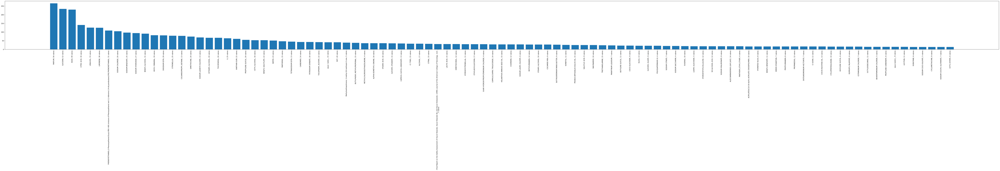

In [20]:

def ingredient_data(rubros):
  return pd.concat([rubro.ingredientes for rubro in rubros], axis = 0).value_counts()[1:100]
df_ing = pd.concat([rubro.ingredientes.value_counts()[1:] for rubro in Rubros], axis = 1)

df_ing.replace(np.nan , 0, inplace = True)
df_bool = df_ing != 0
counts = dict(df_bool.sum(axis = 1))
n_rubros = ingredient_data(Rubros).index.to_series().map(counts)
plabels = [f'{n_rubros.index[i]}, {n_rubros.values[i]} rubros' for i in range(len(n_rubros))]
fig = plt.figure(figsize= (120, 6), dpi= 150)
plt.bar(x = plabels, height= ingredient_data(Rubros).values)
plt.xticks(rotation = 90)
#plt.tight_layout()
plt.show()


In [21]:
reports(Rubros)

##**

|     | Codigo            | Descripcion                                                                                                                                              |   Numero_Ingredientes |   Nro prom. Ingredientes |
|----:|:------------------|:---------------------------------------------------------------------------------------------------------------------------------------------------------|----------------------:|-------------------------:|
| 210 | 7793008009290     | 919 Crema colorante protectora  (Crema colorante protectora/ crema reveladora/tratamiento pre-color con aloe vera/ tratamiento post-color con aloe vera) |                    17 |                       56 |
| 211 | 252               | 919 Crema reveladora                                                                                                                                     |                     9 |                       56 |
| 212 | 253               | 919 Tratamiento pre-color con aloe vera                                                                                                                  |                    22 |                       56 |
| 213 | 254               | 919 Tratamiento post-color con aloe vera                                                                                                                 |                    13 |                       56 |
| 245 | 289               | TheChemistLook_GLICOLICO (Actual)                                                                                                                        |                    17 |                       56 |
| 246 | 290               | TheChemistLook_GLICOLICO (Nuevo)                                                                                                                         |                    13 |                       56 |
| 251 | 295               | TheChemistLook_NIACI (Actual)                                                                                                                            |                     9 |                       56 |
| 252 | 296               | TheChemistLook_NIACI (Nuevo)                                                                                                                             |                     9 |                       56 |
| 378 | 7791001010015     | Biferdil Bio Color COLORACIàN PERMANENTE libre de gluten con ¢leo de arg n y quinoa                                                                      |                    16 |                       56 |
| 379 | 7791001010015 - 2 | Activador cremoso                                                                                                                                        |                     8 |                       56 |
| 380 | 7791001010015 - 3 | Shock potenciador del color                                                                                                                              |                    10 |                       56 |
| 381 | 7791001010015 - 4 | Balsam sellador del color                                                                                                                                |                    12 |                       56 |

##*Cuidado de la piel, Protector Solar*

|     |        Codigo | Descripcion                              |   Numero_Ingredientes |   Nro prom. Ingredientes |
|----:|--------------:|:-----------------------------------------|----------------------:|-------------------------:|
| 348 | 3760211481438 | Crema protectora Ni¤os SPF50+ Alga Maris |                    23 |                       56 |

##*Cuidado de la Piel, Loci¢n Facial*

|     |        Codigo | Descripcion                                |   Numero_Ingredientes |   Nro prom. Ingredientes |
|----:|--------------:|:-------------------------------------------|----------------------:|-------------------------:|
| 370 | 7909189079070 | Avon Care Hidrataci¢n 3 en 1 Locion Facial |                    12 |                       56 |

##*Cuidado del Cabello, Mascarilla*

|     |        Codigo | Descripcion                                                        |   Numero_Ingredientes |   Nro prom. Ingredientes |
|----:|--------------:|:-------------------------------------------------------------------|----------------------:|-------------------------:|
| 349 |           351 | Mascarilla Intensiva Argan Oil Herbal Essences                     |                    15 |                       56 |
| 353 | 4743318166742 | Mascarilla Capilar Reparadora Express Miel y aguacate Organic Shop |                    20 |                       56 |

##*Cuidado Corporal, Loci¢n*

|     |        Codigo | Descripcion                                 |   Numero_Ingredientes |   Nro prom. Ingredientes |
|----:|--------------:|:--------------------------------------------|----------------------:|-------------------------:|
| 330 | 4001638099394 | Weleda Rosa Mosqueta Aceite Corporal Sedoso |                    14 |                       56 |
| 333 | 3282779003131 | Avne Agua Termal                                             |                     2 |                       56 |

##*Cuidado de la Piel, Autobronceador*

|     |        Codigo | Descripcion                                       |   Numero_Ingredientes |   Nro prom. Ingredientes |
|----:|--------------:|:--------------------------------------------------|----------------------:|-------------------------:|
| 361 | 3433422406629 | La Roche-Posay Anthelios Gel Crema Autobronceador |                    22 |                       56 |

##*Cuidado Corporal, Jabones*

|     |        Codigo | Descripcion                                                                        |   Numero_Ingredientes |   Nro prom. Ingredientes |
|----:|--------------:|:-----------------------------------------------------------------------------------|----------------------:|-------------------------:|
|  26 | 7891150064980 | JABON DE TOCADOR DOVE NUTRITIVE SECRETS                                            |                    27 |                       56 |
|  32 | 7798096056812 | Jabon Glicerina neutro Estilo Spa                                                  |                    14 |                       56 |
|  38 | 7790396104095 | Jabon Tocador Heno de Pravia ORIGINAL                                              |                    22 |                       56 |
|  41 | 7791293038025 | Jabon Tocador Suave pepino & Aloe                                                  |                    20 |                       56 |
|  63 | 7791520004151 | JABON DE GLICERINA VERITAS MENTA Y EUCALIPTO                                       |                    16 |                       56 |
| 105 | 8712561594424 | DOVE Gel de Ducha Hidrataci¢n Profunda                                             |                    29 |                       56 |
| 106 | 8712561838788 | DOVE Gel de Ducha Hidrataci¢n Profunda                                             |                    29 |                       56 |
| 109 | 8000700000005 | DOVE Pastilla de jab¢n original hidratante                                         |                    15 |                       56 |
| 126 | 4001638098946 | Weleda Jab¢n vegetal s¢lido de Calndula                                                                                    |                    17 |                       56 |
| 130 | 4025089075127 | SANTEG el de ducha Bio de pi¤a y lim¢n                                             |                    21 |                       56 |
| 135 | 4743318183091 | Oma Getrude Gel ducha nutritivo todo tipo de pieles                                |                    14 |                       56 |
| 136 | 4743318183060 | Oma Gertrude Gel ducha relajante todo tipo de pieles Oma Gertrude                  |                    15 |                       56 |
| 137 | 4001638088268 | Weleda Gel de ducha en crema Rosa Mosqueta                                         |                    18 |                       56 |
| 138 | 4001638088275 | Weleda Gel de ducha en Crema de Citrus                                             |                    14 |                       56 |
| 148 | 8411135350038 | Lactovit Nutritivo Piel Normal Seca                                                |                    33 |                       56 |
| 168 | 7891024035047 | SABONETE PROTEX LIMPEZA PROFUNDA ORIGINAL 85G                                      |                    15 |                       56 |
| 169 | 7891150025998 | SABONETE DOVE BABY HIDRATAAO SENSIVEL 75G                                                                                    |                    18 |                       56 |
| 170 | 7896512900166 | SABONETE GRANADO ANTISSEPTICO 80G                                                  |                    26 |                       56 |
| 176 | 7899706149211 | EFFACLAR CONCENTRADO SABONETE EM BARRA ANTIOLEOSIDADE LA ROCHE 70G                 |                    17 |                       56 |
| 178 | 3433422408586 | LIPIKAR SURGRAS SABONETE LIQUIDO CONCENTRADO ANTIRRESSECAMENTO LA ROCHE 400ML PUMP |                    22 |                       56 |
| 189 | 7891150062160 | Sabonete L¡quido Love, Beauty And Planet àleo de Argan & Lavanda                   |                    20 |                       56 |
| 219 |   12388000022 | Jab¢n Lirio Neutro 150                                                             |                     5 |                       56 |
| 220 |   12388002842 | Jab¢n en Barra Lirio Bath & Spa Aguacate y Aceite de Olivo                         |                    10 |                       56 |
| 221 |   12388002958 | Jab¢n Lirio Coco Antibacterial                                                     |                     6 |                       56 |

##*Cuidado Corporal, Geles de Ba¤o*

|     |        Codigo | Descripcion                                                    |   Numero_Ingredientes |   Nro prom. Ingredientes |
|----:|--------------:|:---------------------------------------------------------------|----------------------:|-------------------------:|
| 266 | 4025089075141 | Gel de ducha Bio de coco y vainilla Sante                      |                    20 |                       56 |
| 267 | 5765228835852 | Gel de Ba¤o Sin Perfume Urtekram                               |                    16 |                       56 |
| 268 | 4743318183091 | Gel ducha nutritivo todo tipo de pieles Oma Gertrude, 500 ml   |                    14 |                       56 |
| 269 | 4744183011533 | Gel de Ducha Relajante Lavande de Provence Organic Shop 280 ml |                    15 |                       56 |
| 270 | 8002849917879 | Gel ¡ntimo BIO Anthyllis                                       |                    12 |                       56 |
| 271 | 5765228836682 | Gel de ducha bayas n¢rdicas BIO Urtekram                       |                    26 |                       56 |
| 272 | 8052400932582 | Gel de ba¤o delicado aloe vera y aceite de oliva Greenatural   |                    17 |                       56 |
| 273 | 3662217004874 | Gel de ducha org nico Infusi¢n de lavanda afrutada Avril       |                    17 |                       56 |
| 274 | 3283950911917 | Gel de ducha relajante Cattier                                 |                    15 |                       56 |

##*Cuidado de la Piel, Mascarilla Exfoliante*

|     |     Codigo | Descripcion                                    |   Numero_Ingredientes |   Nro prom. Ingredientes |
|----:|-----------:|:-----------------------------------------------|----------------------:|-------------------------:|
| 367 | 7704335586 | St. Ives Gentle Smoothing Oatmeal Scrub & Mask |                    19 |                       56 |

##*Cuidado Facial, Exfoliante*

|     |   Codigo | Descripcion                |   Numero_Ingredientes |   Nro prom. Ingredientes |
|----:|---------:|:---------------------------|----------------------:|-------------------------:|
| 243 |      287 | TheChemistLook_MANDLICO (Actual)                            |                    13 |                       56 |
| 244 |      288 | TheChemistLook_MANDLICO (Nuevo)                            |                    13 |                       56 |
| 253 |      297 | TheChemistLook_SA (Actual) |                    26 |                       56 |
| 254 |      298 | TheChemistLook_SA (Nuevo)  |                    21 |                       56 |

##*Cuidado Personal, Cosmeticos*

|     |      Codigo | Descripcion                                                      |   Numero_Ingredientes |   Nro prom. Ingredientes |
|----:|------------:|:-----------------------------------------------------------------|----------------------:|-------------------------:|
| 199 | 20714918477 | Clinique Even Better Refresh Fondotinta e correttore CN 74 Beige |                    56 |                       56 |

##*Cuidado Corporal, Desodorantes Mujer*

|     |        Codigo | Descripcion                                                                     |   Numero_Ingredientes |   Nro prom. Ingredientes |
|----:|--------------:|:--------------------------------------------------------------------------------|----------------------:|-------------------------:|
| 300 |           301 | Desodorante Antitranspirante Roll On Mujer Rexona Clinical Classic              |                     8 |                       56 |
| 301 | 7791293036069 | Desodorante Antitranspirante Aerosol Mujer Rexona Stay Fresh Bamboo & Aloe Vera |                    25 |                       56 |
| 302 | 7791293032467 | Desodorante Antitranspirante Aerosol Mujer Rexona Cotton Dry                    |                    28 |                       56 |

##*Cuidado de la Piel, Crema Reafirmante*

|     |        Codigo | Descripcion                                  |   Numero_Ingredientes |   Nro prom. Ingredientes |
|----:|--------------:|:---------------------------------------------|----------------------:|-------------------------:|
| 362 | 4001638091015 | Crema de Noche reafirmante de Granada Weleda |                    20 |                       56 |

##*Cuidado Facial, Limpieza*

|     |   Codigo | Descripcion                                  |   Numero_Ingredientes |   Nro prom. Ingredientes |
|----:|---------:|:---------------------------------------------|----------------------:|-------------------------:|
| 218 |      259 | The Chemist Look TàNICO EXFOLIANTE MA DIARIO |                    13 |                       56 |
| 337 | 50440542 | Simple Facial Wash Kind to Skin Moisturising |                    23 |                       56 |

##*Cuidado de Cabello, Shampoo*

|     | Codigo        | Descripcion                                                                        |   Numero_Ingredientes |   Nro prom. Ingredientes |
|----:|:--------------|:-----------------------------------------------------------------------------------|----------------------:|-------------------------:|
|   0 | 3             | Shampoo Natura lumina                                                              |                    29 |                       56 |
|   1 | 8429449015857 | Dr. Tree Chmp£ S¢lido 2 en 1 Fortaleza                                             |                    25 |                       56 |
|   2 | 7791293030807 | Sedal Shampoo crema balance                                                        |                    31 |                       56 |
|   3 | 7792640004601 | Shampoo Capilatis Con Palo amargo L¡ðnea Piojos                                    |                    13 |                       56 |
|   4 | 6             | Shampoo T¡ðo Nacho Herbolaria Milenaria Fortalecimiento capilar                    |                     8 |                       56 |
|   5 | 7798036820831 | Shampoo Weleda Fitoshampoo iluminador Manzanilla                                   |                    25 |                       56 |
|   8 | 7500435012201 | PANTENE MAXPROV SHAMPOO CONTROL CAIDA                                              |                    22 |                       56 |
|  16 | 750043502287  | Shampoo Pantene Pro-V Hidratacion Extrema                                          |                    21 |                       56 |
|  22 | 7891150044555 | BABY DOVE SHAMPOO CABELLOS RIZADOS CON ACEITE DE COCO                              |                    13 |                       56 |
|  35 | 7891150051553 | Shampoo Tresemm detox capilar, con t verde, jengibre y prote¡ðna de trigo                                                                                    |                    22 |                       56 |
|  37 | 7790740505578 | Plusbelle Shampoo Lacio                                                            |                    26 |                       56 |
|  46 | 7798140259930 | T¡ðo Nacho Tratamiento Capilar reparador Aloe puro                                 |                    25 |                       56 |
|  48 | 7792640007206 | CAPILATIS Shampoo Dermo Protector                                                  |                    13 |                       56 |
|  51 | 7500435128612 | PANTENE Shampoo Micelar Purifica & hidrata                                         |                    20 |                       56 |
|  61 | 7891150008991 | DOVE SHAMPHIDRINTENSA                                                              |                    27 |                       56 |
|  74 | 7891150062290 | CLEAR SCALPFOODS SHAMPOO ANTICASPA (OJO EL NOMBRE)                                 |                    26 |                       56 |
|  77 | 4017645008014 | Champ£ Anticaspa Bio Logona                                                        |                    19 |                       56 |
|  93 | 98            | NATURAL FRO SHAMPOO SàLIDO                                                         |                     8 |                       56 |
| 110 | 3600542024242 | Fructis Fuerza & Brillo Champ£ Fuerza y Brillo Fortificante                        |                    34 |                       56 |
| 115 | 4015600948016 | Pantene Champ£ Repara y Protege                                                    |                    26 |                       56 |
| 116 | 4084500290532 | Patene Champ£ Cuidado Cl sico                                                      |                    25 |                       56 |
| 117 | 4084500357198 | Pantene Champ£ Cuidado Cl sico                                                     |                    25 |                       56 |
| 118 | 4084500357112 | Pantene Champ£ Repara y Protege                                                    |                    26 |                       56 |
| 119 | 4084500290600 | Pantene Champ£ Suave y Liso                                                        |                    26 |                       56 |
| 120 | 4084500357143 | Pantene Champ£ Suave y Liso                                                        |                    26 |                       56 |
| 121 | 8001841680620 | Pantene Miracle Shampoo Suave y Liso                                               |                    34 |                       56 |
| 122 | 8710447267134 | Tresemme CHAMPé BOTANIQUE REPARACIàN INTENSIVA                                     |                    30 |                       56 |
| 123 | 8710447298930 | Tresemme CHAMPé HIDRATACIàN INTENSA                                                |                    23 |                       56 |
| 124 | 8710447170908 | Tresemme CHAMPé CUIDADO CLµSICO                                                    |                    23 |                       56 |
| 131 | 4025089075233 | Sante Champ£ tratante Bio de naranja y coco                                        |                    18 |                       56 |
| 132 | 4743318168012 | Oma Gertrude Champ£ Reparador Cabellos Secos y Da¤ados                             |                    18 |                       56 |
| 134 | 4743318168005 | Oma Gertrude Champ£ Uso Diario                                                     |                    18 |                       56 |
| 147 | 5765228837467 | Uterkram Champ£ de µrbol de T                                                                                    |                    18 |                       56 |
| 150 | 7891150037434 | Shampoo Seda Crescimento Saud vel 325ml                                            |                    26 |                       56 |
| 151 | 7891150037502 | Seda Shampoo Liso Extremo                                                          |                    26 |                       56 |
| 153 | 7891150025929 | Shampoo Baby Dove HidrataÆo Enriquecida                                                                                    |                    20 |                       56 |
| 157 | 7500435128926 | Pantene MICELAR PURIFICA E HIDRATA SHAMPOO                                         |                    20 |                       56 |
| 162 | 7899026464919 | SHAMPOO ELSEVE ARGININA RESIST X3 CABELOS FRAGILIZADOS OU COM QUEDA 200ML          |                    22 |                       56 |
| 180 | 7899706157117 | SHAMPOO ANTICASPA KERIUM - 200ML                                                   |                    24 |                       56 |
| 186 | 7891150059696 | Love Beauty & Planet ¢leo de argan & lavanda shampoo                               |                    20 |                       56 |
| 193 | 8716716089704 | Rituals Samurai Cool Hair Shampoo Rinfrescante Per Uso Quotidiano                  |                    23 |                       56 |
| 194 | 3661434007422 | Uriage DS Hair Shampoo Cheratoriduttore                                            |                    34 |                       56 |
| 195 | 3661434007415 | Uriage DS Hair Shampoo Antiforfora                                                 |                    30 |                       56 |
| 196 | 3001          | Klorane Shampoo all'Ortica                                                         |                    22 |                       56 |
| 222 | 7899706152860 | Kerium Ds Shampoo Anticaspa Intensivo La Roche-posay                               |                    24 |                       56 |
| 225 | 7896014157525 | Vichy Dercos Energizante Aminexil                                                  |                    21 |                       56 |
| 226 | 7899706149037 | Dercos Sensi Care Vichy Creme De Limpeza Com                                       |                    22 |                       56 |
| 228 | 7896290401855 | Doctar Shampoo                                                                     |                     7 |                       56 |
| 236 | 3401344957253 | Node Ds E Shampoo Anticaspa Bioderma                                               |                    36 |                       56 |
| 241 | 5901887033196 | Ziaja Natural Olive regenerating Shampoo                                           |                    24 |                       56 |
| 299 | 7791293005010 | SHAMPOO DOVE RECONTRUCCIàN COMPLETA                                                |                    31 |                       56 |
| 306 | 307           | EcoHair Shampoo Anti-ca¡da                                                         |                    16 |                       56 |
| 308 | 309           | EcoHair SHAMPOO ANTICASPA                                                          |                    18 |                       56 |
| 310 | 7509546026800 | Caprice Special Fall Control Shampoo                                               |                     6 |                       56 |
| 311 | 650240033476  | Vanart 25 Fl. Oz. Classic Freshness Herbal Shampoo                                 |                    21 |                       56 |
| 312 |               | 7509546066417 Shampoo Palmolive Optims Therma Protect                              |                    21 |                       56 |
| 313 |               | 7509546026114 Alert Shampoo 2 en 1. Control caspa                                  |                    13 |                       56 |
| 314 | 79400922809   | Suave Naturals Refreshing Waterfall Mist Shampoo                                   |                    20 |                       56 |
| 315 | 71249207277   | L'Oreal Paris Elvive Color Vibrancy Protecting Shampoo                             |                    35 |                       56 |
| 316 | 816559012926  | Alberto VO5 Normal Balancing Shampoo, 12.5 fl. oz                                  |                    18 |                       56 |
| 317 | 8906019231324 | Barbie Conditioning Shampoo Long & Bouncy 200Ml                                    |                    20 |                       56 |
| 318 | 37836084713   | Champ£ Grisi manzanilla. Brillo luminoso. 13.5 Fl oz                               |                    21 |                       56 |
| 319 | 37836084836   | Champ£ Grisi Kids manzanilla                                                       |                    18 |                       56 |
| 320 | 71249237069   | L'Oreal Paris L'Oreal Kids Extra Gentle 2-in-1 Shampoo, Sunny Orange Swim          |                    22 |                       56 |
| 321 | 381371178353  | Johnson's CottonTouch Newborn Baby Wash & Shampoo, 27.1 fl. Oz                     |                    13 |                       56 |
| 322 | 323           | Diana Shampoo Rich in Natural Proteins                                             |                    22 |                       56 |
| 323 | 603084491254  | Garnier Fructis Sleek & Shine Shampoo, Frizzy, Dry, Unmanageable Hair  12.5 fl. oz |                    35 |                       56 |
| 324 | 603084542321  | Garnier Fructis Pure Clean Fortifying Shampoo                                      |                    32 |                       56 |
| 325 | 603084491452  | Garnier Fructis Color Shield Fortifying Shampoo for Color-Treated Hair 12.5 fl. oz |                    41 |                       56 |
| 327 | 3600542024228 | Garnier Fructis Champ£ Fortificador                                                |                    38 |                       56 |
| 328 | 4001638075107 | Weleda 2in1 Shampoo & Body Washs Lima Chispeante                                   |                    19 |                       56 |
| 340 | 4743318182940 | Organic Shop Lavish Avocado and honey shampoo                                      |                    16 |                       56 |
| 342 | 7506295302292 | Shampoo Herbal Essences Pelo suave e hidratado hidradis¡aco                        |                    26 |                       56 |
| 372 | 374           | Pantene Shampoo Edici¢n de Verano                                                  |                    22 |                       56 |
| 374 | 376           | Herbal Essences Champ£ Pomelo Blanco & Menta Mosa                                  |                    23 |                       56 |
| 375 | 7500435020169 | Head and Shoulders Shampoo control caspa. Humectaci¢n                              |                    25 |                       56 |
| 376 | 7500435020671 | Head and Shoulders Shampoo control caspa. Control comez¢n                          |                    27 |                       56 |

##*Cuidado Personal*

|    |        Codigo | Descripcion    |   Numero_Ingredientes |   Nro prom. Ingredientes |
|---:|--------------:|:---------------|----------------------:|-------------------------:|
| 71 | 7798095410974 | KLORANE AMANDE |                    23 |                       56 |

##*Cuidado Personal, Dermocosmtica*

|     |        Codigo | Descripcion                    |   Numero_Ingredientes |   Nro prom. Ingredientes |
|----:|--------------:|:-------------------------------|----------------------:|-------------------------:|
| 339 | 7798120265814 | CAVIAHUE gel exfoliante facial |                     9 |                       56 |

##*Cuidado corporal, desodorante mujer*

|    |   Codigo | Descripcion                 |   Numero_Ingredientes |   Nro prom. Ingredientes |
|---:|---------:|:----------------------------|----------------------:|-------------------------:|
| 12 | 75027513 | Desodorante para Mujer Dove |                    22 |                       56 |

##*Cuidado de la Piel, Agua Micelar*

|     |        Codigo | Descripcion                                           |   Numero_Ingredientes |   Nro prom. Ingredientes |
|----:|--------------:|:------------------------------------------------------|----------------------:|-------------------------:|
| 355 | 3517360010572 | Agua Micelar Aloe Dermo - Piel sensible SO'BIO tic                                                       |                    13 |                       56 |
| 356 | 8420649500198 | Agua Micelar Limpiadora ARMONIA                       |                    15 |                       56 |
| 365 | 3600541744523 | Garnier SkinActive Agua Micelar en Aceite/àleo        |                    23 |                       56 |
| 366 | 3600541594937 | Garnier SkinActive Pure Active Agua Micelar Todo en 1 |                     8 |                       56 |

##*Cuidado Facial, Hidrataci¢n*

|     |        Codigo | Descripcion                                      |   Numero_Ingredientes |   Nro prom. Ingredientes |
|----:|--------------:|:-------------------------------------------------|----------------------:|-------------------------:|
| 239 | 7896658026997 | Profuse Densifiant Creme                         |                    47 |                       56 |
| 240 | 3337872414152 | Pigmentclar Olhos                                |                    36 |                       56 |
| 264 |      42360407 | Creme Facial Nivea Nutritivo                     |                    17 |                       56 |
| 295 | 4025089076933 | Crema Hidratante facial y corporal Granada Sante |                    30 |                       56 |

##*Cuidado Facial, Humectante*

|     |   Codigo | Descripcion                   |   Numero_Ingredientes |   Nro prom. Ingredientes |
|----:|---------:|:------------------------------|----------------------:|-------------------------:|
| 249 |      293 | TheChemistLook_HYALU (Actual) |                     8 |                       56 |
| 250 |      294 | TheChemistLook_HYALU (Nuevo)  |                     8 |                       56 |

##*Bebes, Despus del Ba¤o*

|    |        Codigo | Descripcion                           |   Numero_Ingredientes |   Nro prom. Ingredientes |
|---:|--------------:|:--------------------------------------|----------------------:|-------------------------:|
| 24 | 7790010684224 | Johnsonïs baby colonia fresca caricia |                    14 |                       56 |

##*Cuidado de la Piel, Hidratante Facial*

|     |        Codigo | Descripcion                                |   Numero_Ingredientes |   Nro prom. Ingredientes |
|----:|--------------:|:-------------------------------------------|----------------------:|-------------------------:|
| 359 | 4001638086875 | Fluido alisante de Rosa de Mosqueta Weleda |                    27 |                       56 |

##*Cuidado Corporal, Creamas Corporales*

|     |   Codigo | Descripcion   |   Numero_Ingredientes |   Nro prom. Ingredientes |
|----:|---------:|:--------------|----------------------:|-------------------------:|
| 309 |      310 | UMANE CREMA   |                    15 |                       56 |

##*Cuidado Bucal, Crema Dental*

|     |        Codigo | Descripcion                                        |   Numero_Ingredientes |   Nro prom. Ingredientes |
|----:|--------------:|:---------------------------------------------------|----------------------:|-------------------------:|
| 242 | 7896015525804 | Corega Ultra Cr S/sabor                            |                     8 |                       56 |
| 255 | 7891037744509 | Creme Dental em Gel Close Up Liquid Fresh Ice      |                    14 |                       56 |
| 256 | 7896015518325 | Creme Dental Sensodyne Pro Esmalte                 |                    16 |                       56 |
| 257 | 7896015528577 | Creme Dental Sensodyne Repair E Protect Whitening  |                    11 |                       56 |
| 258 | 7896009419324 | Creme Dental Sensodyne Original                    |                    19 |                       56 |
| 259 | 4001638081863 | Weleda Gel Dent¡frico para Ni¤os                   |                     9 |                       56 |
| 357 | 7891024041628 | Crema Dental Colgate Sesitive Pro-Alivio Inmediato |                    15 |                       56 |

##*Cuidado Facial, Cremas Hidratantes*

|    |        Codigo | Descripcion                                                |   Numero_Ingredientes |   Nro prom. Ingredientes |
|---:|--------------:|:-----------------------------------------------------------|----------------------:|-------------------------:|
| 53 | 7798214898706 | JACTAN'S M scara Facial Regeneradora anti age con col geno |                    29 |                       56 |
| 90 | 3499320009737 | Crema facial hidratante de Noche con µcido Hialur¢nico     |                    33 |                       56 |
| 91 |            96 | Loci¢n facial hidratante de d¡ða con µcido Hialur¢nico     |                    17 |                       56 |
| 92 |            97 | Cetaphil Hidratante Facial Diario FPS                      |                    35 |                       56 |

##*Cuidado de la piel, Cremas Corporales*

|     |        Codigo | Descripcion                                          |   Numero_Ingredientes |   Nro prom. Ingredientes |
|----:|--------------:|:-----------------------------------------------------|----------------------:|-------------------------:|
| 344 | 4005900399946 | Nivea Loci¢n Corporal Vainilla y Aceite de Almendras |                    20 |                       56 |
| 345 | 4005808315093 | Nivea Crema Corporal Milk Nutritiva                  |                    22 |                       56 |

##*Cuidado Corporal, Jab¢n L¡quido*

|     |        Codigo | Descripcion               |   Numero_Ingredientes |   Nro prom. Ingredientes |
|----:|--------------:|:--------------------------|----------------------:|-------------------------:|
| 346 | 7702010420320 | Protex Jab¢n L¡quido Aloe |                    20 |                       56 |

##*Cuidado Corporal, Desodorante de Hombre*

|     |        Codigo | Descripcion                                   |   Numero_Ingredientes |   Nro prom. Ingredientes |
|----:|--------------:|:----------------------------------------------|----------------------:|-------------------------:|
| 261 |           305 | Desodorante Rexona Clinical Aerosol 3x mais proteÆo                                               |                    22 |                       56 |
| 262 | 7506306244184 | Rexona Men Antitranspirante Aerosol Invisible |                    25 |                       56 |

##*Cuidado Corporal, Jab¢n*

|     |        Codigo | Descripcion                                          |   Numero_Ingredientes |   Nro prom. Ingredientes |
|----:|--------------:|:-----------------------------------------------------|----------------------:|-------------------------:|
| 275 | 8445303149599 | Jab¢n s¢lido corporal Vainilla y Karit Planeta Huerto                                                      |                    13 |                       56 |
| 276 | 8421427033068 | Jab¢n pastilla coco puro sin perfume Beltr n Vital   |                     5 |                       56 |
| 277 | 8437015175706 | Jab¢n de Alepo 40% Inkanat                           |                     5 |                       56 |
| 278 | 5765228835845 | Jab¢n Sin Perfume Urtekram                           |                     6 |                       56 |
| 279 | 5765228838648 | Jab¢n Aloe Vera Urtekram                             |                     9 |                       56 |
| 280 | 4744183011656 | Jab¢n de Manos Nutritivo Melocot¢n Rosa Organic Shop |                    14 |                       56 |
| 281 | 5765228835876 | Jab¢n de manos Sin Perfume Urtekram                  |                    15 |                       56 |
| 282 | 8437015175713 | Jab¢n de Alepo Inkanat, 4%                           |                     4 |                       56 |
| 283 | 4007547301948 | Jab¢n de manos neutral Sonett                        |                     6 |                       56 |
| 284 | 4007547301849 | Aceite de Oliva, Aceite de Coco                      |                     6 |                       56 |

##*Bebes, Despues del Ba¤o*

|     |        Codigo | Descripcion                  |   Numero_Ingredientes |   Nro prom. Ingredientes |
|----:|--------------:|:-----------------------------|----------------------:|-------------------------:|
| 166 | 7896279102636 | TALCO MURIEL BABY MENINA 75G |                    12 |                       56 |

##*Cuidado Corporal, Exfoliantes*

|     |       Codigo | Descripcion                         |   Numero_Ingredientes |   Nro prom. Ingredientes |
|----:|-------------:|:------------------------------------|----------------------:|-------------------------:|
| 335 | 524517683001 | Punk Bouquet Body Scrub Bath & Body |                    19 |                       56 |

##*Cuidado Corporal, Pies y Manos*

|     |        Codigo | Descripcion                                                             |   Numero_Ingredientes |   Nro prom. Ingredientes |
|----:|--------------:|:------------------------------------------------------------------------|----------------------:|-------------------------:|
| 285 | 4743318183053 | Oma Gertrude Crema Pies Cuidado Intenso                                 |                    19 |                       56 |
| 286 | 4627090994116 | Crema para pies hidratante Caf Mimi                                                                         |                    16 |                       56 |
| 287 |  705105357355 | Reparadora de Codos y Talones Bio Matarrania                            |                    10 |                       56 |
| 288 | 4743318183183 | Crema natural refrescante anti-fatiga para pies Organic Kitchen         |                    26 |                       56 |
| 289 | 4021457614516 | Crema de pies basis sensitive, con aceite de macadamia y arcilla Lavera |                    30 |                       56 |
| 290 | 3760141874553 | Polvo Absorbente Pies Gamarde                                           |                    10 |                       56 |
| 291 | 4025089073161 | Crema manos bio Goji Oliva Sante                                        |                    25 |                       56 |
| 292 | 5765228835883 | Crema de Manos sin Perfume Urtekram                                     |                    18 |                       56 |
| 293 | 4033981702034 | Crema de Manos Echinacea EcoCosmetics                                   |                    18 |                       56 |
| 294 | 5765228147658 | Crema de manos abedul n¢rdico Urtekram                                  |                    25 |                       56 |

##*Cuidado de la Piel, Limpiador Facial y Corporal*

|     |   Codigo | Descripcion                                   |   Numero_Ingredientes |   Nro prom. Ingredientes |
|----:|---------:|:----------------------------------------------|----------------------:|-------------------------:|
| 368 |      370 | REFRESHING BODY WASH ROSE WATER AND ALOE VERA |                    20 |                       56 |

##*Cuidado Bucal, Enjuague Bucal*

|     |        Codigo | Descripcion                                |   Numero_Ingredientes |   Nro prom. Ingredientes |
|----:|--------------:|:-------------------------------------------|----------------------:|-------------------------:|
|  39 | 7891010619442 | Enj Bucal LISTERINE Cool Mint Zero Alcohol |                    14 |                       56 |
|  59 | 7891024136096 | COLGATE PLAX ICE                           |                    15 |                       56 |
| 336 | 8718951192683 | Colgate Plax Soft Mint                     |                    13 |                       56 |

##*Cuidado de la Piel, Mascarilla Facial*

|     |        Codigo | Descripcion                                      |   Numero_Ingredientes |   Nro prom. Ingredientes |
|----:|--------------:|:-------------------------------------------------|----------------------:|-------------------------:|
| 371 | 7909189148080 | Avon Care Banana Revitalizante Mascarilla Facial |                    18 |                       56 |

##*Cuidado de la piel, Protector Solar*

|     |        Codigo | Descripcion                                              |   Numero_Ingredientes |   Nro prom. Ingredientes |
|----:|--------------:|:---------------------------------------------------------|----------------------:|-------------------------:|
| 347 | 3760211482015 | Protector Solar en Spray cara & cuerpo SPF 30 Alga Maris |                    19 |                       56 |

##*Cuidado Corporal, Toallitas H£medas*

|     |        Codigo | Descripcion                                |   Numero_Ingredientes |   Nro prom. Ingredientes |
|----:|--------------:|:-------------------------------------------|----------------------:|-------------------------:|
| 351 | 8717163953051 | Toallitas h£medas biodegradables Baby Dove |                     9 |                       56 |
| 352 |  782126200112 | Toallitas para beb Natracare                                            |                    27 |                       56 |

##*Cuidado Facial, Hidratantes*

|     |        Codigo | Descripcion                                                  |   Numero_Ingredientes |   Nro prom. Ingredientes |
|----:|--------------:|:-------------------------------------------------------------|----------------------:|-------------------------:|
| 175 | 7891010887742 | NEUTROGENA HYDRO BOOST WATER GEL FPS25 HIDRATANTE FACIAL 55G |                    26 |                       56 |
| 181 |          2020 | The Body Shop Creme Firmador Facial Roots Of Strength        |                    40 |                       56 |
| 192 | 3700527702261 | IOMA Gel Riparatore Giorno e Notte 7 x 1 ml Monodose         |                    24 |                       56 |
| 231 | 7896658026980 | Profuse Densifiant Fondant Olhos                             |                    35 |                       56 |

##*Cuidados de Bebs, Para Ba¤o*

|     |        Codigo | Descripcion                      |   Numero_Ingredientes |   Nro prom. Ingredientes |
|----:|--------------:|:---------------------------------|----------------------:|-------------------------:|
| 338 | 7891010669843 | Johnson's Baby Jab¢n glicerinado |                    21 |                       56 |

##*Cuidado Bucal, Crema Dentral*

|     |        Codigo | Descripcion                                                      |   Numero_Ingredientes |   Nro prom. Ingredientes |
|----:|--------------:|:-----------------------------------------------------------------|----------------------:|-------------------------:|
|  17 | 7506195131664 | Oral B Crema Dental Complete 4en1                                |                    16 |                       56 |
|  18 | 7793100111877 | Colgate Crema Dental Colgate Triple Acci¢n Menta Original        |                    18 |                       56 |
|  21 | 7896015519223 | Sensodyne blanqueador extra fresh                                |                    16 |                       56 |
|  50 | 7791293034553 | Gel Dental Close Up White Attraction Men                         |                    18 |                       56 |
|  52 | 7896015527457 | Parodontax Fl£or                                                 |                    15 |                       56 |
|  79 | 7794640662553 | Sensodyne Pro-Esmalte Blanqueador                                |                    13 |                       56 |
|  80 | 7896015520526 | Sensodyne Pro-Esmalte Crema Dental de Uso Diario                 |                    15 |                       56 |
|  81 | 3014260279165 | Oral B Stages Crema Dental Disney Princess                       |                    14 |                       56 |
|  82 | 7793100111570 | Colgate Crema Dental M xima protecci¢n anticaries Sabor Original |                    13 |                       56 |
|  83 | 7793100111563 | Colgate Crema Dental M xima protecci¢n anticaries Sabor Original |                    13 |                       56 |
|  84 | 7500435127363 | Oral B Kids Crema Dental                                         |                    19 |                       56 |
| 141 | 4017645042247 | Logodent Dent¡frico Menta Bio Daily Care Logona                  |                    15 |                       56 |
| 142 | 4037067280102 | Neobio Dentifrico romero y hamamelis sin fluor                   |                    18 |                       56 |
| 143 | 4017645042346 | Logodent Gel Dent¡frico Fresas Ni¤os                             |                    14 |                       56 |
| 152 | 7891150049888 | Close Up Creme Dental Triple HortelÆ 70g                         |                    14 |                       56 |

##* Cuidado Corporal, Desodorantes*

|     |        Codigo | Descripcion                                |   Numero_Ingredientes |   Nro prom. Ingredientes |
|----:|--------------:|:-------------------------------------------|----------------------:|-------------------------:|
| 161 | 7891177816852 | DESODORANTE NIVEA SPRAY FRESH NATURAL 90ML |                    10 |                       56 |

##*Cuidado de Beb, Para el Ba¤o*

|     |        Codigo | Descripcion                |   Numero_Ingredientes |   Nro prom. Ingredientes |
|----:|--------------:|:---------------------------|----------------------:|-------------------------:|
| 260 | 7891010030452 | Condicionador J&j Baby     |                    10 |                       56 |
| 263 | 7891010030476 | Condicionador J&j Camomila |                    10 |                       56 |

##*Cuidado Facial, Antiarrugas*

|     |        Codigo | Descripcion                        |   Numero_Ingredientes |   Nro prom. Ingredientes |
|----:|--------------:|:-----------------------------------|----------------------:|-------------------------:|
| 179 | 3337872413728 | CREME ANTI-IDADE HYALU B5 REPAIR   |                    28 |                       56 |
| 230 | 3337872413155 | La Roche Posay Effaclar Anti-idade |                    17 |                       56 |
| 232 | 3337872413704 | Redermic Hyalu C Tubo              |                    25 |                       56 |
| 234 | 3337875583589 | CREME ANTI-IDADE HYALU B5 REPAIR   |                    28 |                       56 |
| 235 | 7896658026355 | Essencele Profuse Filler R         |                    33 |                       56 |
| 332 |           333 | Weleda Crema de D¡a Alisante       |                    28 |                       56 |

##*Cuidado Corporal, Hidratantes*

|     |        Codigo | Descripcion                            |   Numero_Ingredientes |   Nro prom. Ingredientes |
|----:|--------------:|:---------------------------------------|----------------------:|-------------------------:|
| 334 | 3337872413025 | La Roche Posay Effaclar Mat hidrarante |                    24 |                       56 |
| 341 |           342 | The Chemist Look Hidratante Piel Mixta |                    29 |                       56 |

##*Cuidado Corporal, Protectores Diarios*

|    |        Codigo | Descripcion                                 |   Numero_Ingredientes |   Nro prom. Ingredientes |
|---:|--------------:|:--------------------------------------------|----------------------:|-------------------------:|
| 19 | 7790010616751 | Carefree Protectores Diarios Todos los Dias |                     6 |                       56 |

##*Cuidado de Cabello, Acondicionador*

|     |        Codigo | Descripcion                                                            |   Numero_Ingredientes |   Nro prom. Ingredientes |
|----:|--------------:|:-----------------------------------------------------------------------|----------------------:|-------------------------:|
|   6 | 7500435116718 | ACONDICIONADOR PANTENE 3MIN FUERZA RECONSTRUCCION                      |                    18 |                       56 |
|   9 | 7791293033969 | Acondicionador Tresemm Blindaje Platinum                                                                        |                    23 |                       56 |
|  10 | 7500435013796 | PANTENE Acondicionador Pro-V Hidratacion Extrema                       |                    18 |                       56 |
|  15 |  750043501232 | ACOND PANTENE HIDRATACION MAX                                          |                    14 |                       56 |
|  31 | 7509552800418 | Elvive Acondicionador Arcilla Purificante Elvive Loreal Par¡ðs         |                    21 |                       56 |
|  36 | 7500435106412 | Acondicionador PANTENE 3MIN HIDRATACION EXTREMA                        |                    18 |                       56 |
|  45 |  650240024689 | T¡ðo Nacho Acondicionador Anti-Edad Jalea Real                         |                    23 |                       56 |
|  58 | 7891150023420 | ACONDICIONADOR DOVE FUERZ HIDRA                                        |                    17 |                       56 |
|  75 | 7898587761987 | ELVIVE ACONDICIONADOR REPARACIàN RµPIDA                                |                    23 |                       56 |
| 111 | 3600542256742 | Fructis Pure Fresh Agua de Coco Acondicionador Pure Fresh Agua de Coco |                    34 |                       56 |
| 183 |          2022 | Condicionador De Morango                                               |                    17 |                       56 |
| 307 |           308 | EcoHair REPARADOR CAPILAR - BALSAMO ACONDICIONADOR                     |                    15 |                       56 |
| 326 | 3600521707128 | L'Oreal Elvive Total Repairs Acondicionador                            |                    28 |                       56 |
| 343 | 7501065904522 | Acondicionador Herbal Essences Pelo suave e hidratado hidradis¡aco     |                    19 |                       56 |
| 377 | 7500435147583 | Head and Shoulders dermo-acondicionador hidrataci¢n                    |                    16 |                       56 |

##*Cuidado Corporal, Jab¢n en Barra*

|     |        Codigo | Descripcion   |   Numero_Ingredientes |   Nro prom. Ingredientes |
|----:|--------------:|:--------------|----------------------:|-------------------------:|
| 350 | 4005900620552 | Jab¢n Nivea   |                    17 |                       56 |

##*Cuidado Corporal, Lociones Corporales*

|     |        Codigo | Descripcion                                                                     |   Numero_Ingredientes |   Nro prom. Ingredientes |
|----:|--------------:|:--------------------------------------------------------------------------------|----------------------:|-------------------------:|
|  94 |           101 | Cetaphil sun after sun repaire loci¢n liposomal                                 |                    19 |                       56 |
| 197 | 3264680014871 | Nuxe Aquabella Beauty-Revealing Essence Lozione-Essenza Rivelatrice di Bellezza |                    21 |                       56 |
| 200 | 3614272132931 | Biotherm Skin Oxygen SPF 15 Crema Corpo                                         |                    40 |                       56 |
| 203 | 8429420128644 | ISDIN MICELLAR SOLUTION                                                         |                     8 |                       56 |

##*Cuidado Corporal, Desodorantes*

|     |        Codigo | Descripcion                                                           |   Numero_Ingredientes |   Nro prom. Ingredientes |
|----:|--------------:|:----------------------------------------------------------------------|----------------------:|-------------------------:|
| 104 |      80466437 | DOVE Desodorante Antitranspirante Stick Original                      |                    26 |                       56 |
| 107 | 8717163997345 | DOVE Desodorante Original sin alcohol anti-transpirante 48h spray     |                    25 |                       56 |
| 108 | 8717163004869 | DOVE Desodorante Go Fresh sin alcohol anti-transpirante 48h spray     |                    20 |                       56 |
| 172 | 7500435129947 | DESODORANTE GILLETTE STICK CLEAR GEL COOL WAVE 45G                    |                     9 |                       56 |
| 173 | 7791293032436 | DESODORANTE REXONA AE POWDER WOMEN 150ML                              |                     9 |                       56 |
| 174 | 3337872412141 | DESODORANTE LA ROCHE AE PELES SENSIVEIS 150ML                         |                    11 |                       56 |
| 187 |   55086002394 | Love Beauty & Planet manteiga de murumuru & rosa desodorante stick    |                    23 |                       56 |
| 188 | 7891150065024 | Desodorante Creme Love, Beauty And Planet Manteiga de Murumuru & Rosa |                    22 |                       56 |
| 304 | 7791293032481 | DESODORANTE ANTIT EN AEROSOL REXONA INVISIBLE                         |                    27 |                       56 |
| 329 |      80466444 | Desodorante roll on Dove original                                     |                    20 |                       56 |
| 331 |      78936515 | Desodorante roll on Simple Invisible                                  |                     8 |                       56 |

##*Cuidado Facial, Antiacn*

|    |   Codigo | Descripcion                                                      |   Numero_Ingredientes |   Nro prom. Ingredientes |
|---:|---------:|:-----------------------------------------------------------------|----------------------:|-------------------------:|
| 55 | 77959966 | Farma Clean M scara Puntos Negros (con carb¢n activado de bamb£) |                    13 |                       56 |

##*Cuidado Corporal, Manos y Pies*

|     |        Codigo | Descripcion                                       |   Numero_Ingredientes |   Nro prom. Ingredientes |
|----:|--------------:|:--------------------------------------------------|----------------------:|-------------------------:|
|  29 | 7899846091944 | Ekos Pitanga Natura Pulpa hidratante para manos   |                    27 |                       56 |
|  44 | 4005800137570 | Atrix Intensive crema para manos                  |                    23 |                       56 |
|  86 |            91 | Cetaphil Crema para manos                         |                    17 |                       56 |
| 127 | 4025089073161 | Sante Crema manos bio Goji Oliva                  |                    26 |                       56 |
| 182 |          2021 | The Body Shop Creme para as mÆos Flores de Lolita |                    16 |                       56 |
| 215 |           256 | The Chemist Look CREMA PARA MANOS                 |                    17 |                       56 |

##*Cuidado Personal, Cuidado Coporal:Lociones Corporales*

|     |        Codigo | Descripcion            |   Numero_Ingredientes |   Nro prom. Ingredientes |
|----:|--------------:|:-----------------------|----------------------:|-------------------------:|
| 190 | 8470003173704 | ISDIN Lozione Doposole |                    25 |                       56 |

##*Cuidado de Cabello, Tratamiento Capilar*

|     |        Codigo | Descripcion                                                                     |   Numero_Ingredientes |   Nro prom. Ingredientes |
|----:|--------------:|:--------------------------------------------------------------------------------|----------------------:|-------------------------:|
|  47 | 7791001002140 | Biferdil b lsamo BA con filtro UV                                               |                    21 |                       56 |
|  78 | 3474636349913 | KRATASE DISCIPLINE OLEO CURL                                                                                 |                    32 |                       56 |
| 133 | 4743318168050 | Oma Gertrude Mascarilla capilar reparaci¢n y nutrici¢n cabellos secos y da¤ados |                    18 |                       56 |
| 149 | 7891037000322 | Seda Creme de Pentear Cachos Definidos 300ml                                    |                    23 |                       56 |
| 184 |          2023 | Pantene TRATAMENTO CAPILAR MICRO-BLINDAGEM                                      |                    17 |                       56 |
| 185 | 7898587762878 | Garnier Creme de Pentear Fructtis ¢leo Blindagem                                |                    17 |                       56 |

##*Cuidado de la Piel, Crema Hidratante Facial*

|     |        Codigo | Descripcion                                                              |   Numero_Ingredientes |   Nro prom. Ingredientes |
|----:|--------------:|:-------------------------------------------------------------------------|----------------------:|-------------------------:|
| 360 | 8436560112518 | Botanical Crema facial Hidratante Reparadora Higo chumbo Alcaparra Olivo |                    32 |                       56 |

##*Cuidado Bucal, Creama Dental*

|     |        Codigo | Descripcion                                  |   Numero_Ingredientes |   Nro prom. Ingredientes |
|----:|--------------:|:---------------------------------------------|----------------------:|-------------------------:|
| 171 | 7896015518325 | CREME DENTAL SENSODYNE PRO ESMALTE MENTA 50G |                    13 |                       56 |

##*Cuidado de la Piel, Crema de Manos*

|     |        Codigo | Descripcion                                            |   Numero_Ingredientes |   Nro prom. Ingredientes |
|----:|--------------:|:-------------------------------------------------------|----------------------:|-------------------------:|
| 364 | 7909189077649 | Avon Care restauraci¢n de aceite y coco Crema de Manos |                    15 |                       56 |

##*Cuidado corporal, Jabones*

|    |        Codigo | Descripcion                        |   Numero_Ingredientes |   Nro prom. Ingredientes |
|---:|--------------:|:-----------------------------------|----------------------:|-------------------------:|
| 13 | 7791293037660 | Lux Jab¢n L¡ðquido Rosas Francesas |                    31 |                       56 |
| 14 | 7791293037684 | Lux Jab¢n L¡ðquido Orqu¡ðdea Negra |                    29 |                       56 |
| 25 | 7898422746759 | JABON DE TOCADOR DOVE CREMOSO      |                    23 |                       56 |

##*Cuidado de la Piel, Limpiador Facial*

|     |   Codigo | Descripcion                             |   Numero_Ingredientes |   Nro prom. Ingredientes |
|----:|---------:|:----------------------------------------|----------------------:|-------------------------:|
| 369 | 42231509 | Nivea Gel Limpiador Facial Equilibrante |                    22 |                       56 |

##*Cuidado Corporal, Cremas Corporales*

|     | Codigo        | Descripcion                                                                 |   Numero_Ingredientes |   Nro prom. Ingredientes |
|----:|:--------------|:----------------------------------------------------------------------------|----------------------:|-------------------------:|
|  27 | 7509552800098 | AGUA MICELAR BIFASICA LïOREAL PARIS                                         |                    10 |                       56 |
|  34 | 4005800137556 | NIVEA Crema Hidratante en Lata                                              |                    22 |                       56 |
|  42 | 7791293033075 | Crema corporal St Ives iel renovada                                         |                    23 |                       56 |
|  43 | 8901030661860 | Dove Crema nutritiva enriquecida                                            |                    27 |                       56 |
|  49 | 7790299000081 | Crema SAPOLAN ferrini Tradicional                                           |                     7 |                       56 |
|  60 | 4005808041817 | CREMA NIVEA BODY HIDRA                                                      |                    14 |                       56 |
|  62 | 7794490630245 | ETIQUET CLASICO                                                             |                    20 |                       56 |
|  64 | 4005808881512 | NIVEA BODYCELULITIS                                                         |                    20 |                       56 |
|  65 | 7798064430224 | CREMA PARA MANOS Y CUERPO REGENERACIPON INTENSIVA ORDE¥E EVO                |                    22 |                       56 |
|  66 | 7794207084118 | MIDERMUS CREMA DE ORDE¡'E NUTRITIVA HUMECTANTE VITAMINA A&E                 |                    21 |                       56 |
|  67 | 7794207084095 | MIDERMUS CREMA DE ORDE¡'E NUTRITIVA HUMECTANTE VITAMINA A&E                 |                    21 |                       56 |
|  68 | 7798064434284 | CREMA PARA MANOS Y CUERPO REGENERACIPON INTENSIVA ORDE¥E EVO                |                    22 |                       56 |
|  69 | 7790375004378 | BAGOVIT A CUIDADOS COTIDIANOS EFECTO SEDA                                   |                    42 |                       56 |
|  70 | 7791520006155 | CREMA CORPORAL VERITAS                                                      |                    31 |                       56 |
|  72 | 3474630658448 | KRASTASE DENSIFIQUE BAIN DENSIT                                                                             |                    26 |                       56 |
|  73 | 3337872413902 | LIPIKAR GEL-FLUIDE LA ROCHE POSAY                                           |                    19 |                       56 |
|  76 | 7899026487093 | CREMA DE TRATAMIENTO ELVIVE KERA-LISO                                       |                    27 |                       56 |
|  85 | 3499320003223 | Cetaphil Emulsi¢n Hidratante                                                |                    17 |                       56 |
|  87 | 3499320005302 | Cetaphil Crema Hidratante                                                   |                    20 |                       56 |
|  88 | 93            | Cetaphil Crema Hidratante                                                   |                    20 |                       56 |
|  89 | 94            | Cetaphil Loci¢n Ultra Humectante                                            |                    17 |                       56 |
| 101 | 110           | Cetaphil AD control hidratante corporal                                     |                    28 |                       56 |
| 103 | 8710447437285 | DOVE Secretos Hidratantes Ritual Restaurador Loci¢n Corporal Spray          |                    29 |                       56 |
| 125 | 4001638501484 | Weleda Skin Food Light                                                      |                    22 |                       56 |
| 128 | 3283950911184 | Cattier Leche Hidratante Nutritiva                                          |                    18 |                       56 |
| 129 | 3283950911153 | Cattier Leche Hidratante Nutritiva                                          |                    24 |                       56 |
| 139 | 3283950917308 | Cattier Manteca Karit Bio                                                                             |                     1 |                       56 |
| 140 | 3596206332825 | Weleda Crema Rostro y Cuerpo de Calndula                                                                             |                    16 |                       56 |
| 155 | 7501056348922 | Dove LoÆo Desodorante Hidratante Corporal Dove NutriÆo Essencial 200ml                                                                             |                    32 |                       56 |
| 156 | 7891150028425 | Vasenol LoÆo Desodorante Hidratante NutriÆo do Cacau 200ml                                                                             |                    28 |                       56 |
| 158 | 4001638093668 | WELEDA SABONETE LIQUIDO CORPORAL                                            |                    18 |                       56 |
| 159 | 7897930762060 | CETAPHIL LOCAO HIDRATANTE FACE E BODY PELE NORMAL A SECA 473ML              |                    17 |                       56 |
| 165 | 4005808890590 | Nivea Soft Cream                                                            |                    27 |                       56 |
| 177 | 7897930762053 | CETAPHIL CREME HIDRATANTE BODY PELE EXTREMAMENTE SECA E SENSIVEL 453G       |                    21 |                       56 |
| 191 | 8029182005025 | BIOEARTH LOOM CREME RICHE CREMA ALLA BAVA DI LUMACA 78%                     |                    20 |                       56 |
| 198 | 5060033779064 | Ren Evercalm Latte Detergente Delicato                                      |                    30 |                       56 |
| 201 | 3614272079687 | Biotherm Bath Therapy Invigorating Blend Crema corpo rinvigorente           |                    31 |                       56 |
| 202 | 3614272079632 | Biotherm Bath Therapy Invigorating Blend Body Smoothing Scrub               |                    25 |                       56 |
| 204 | 3367729023930 | Biotherm Eau Vitamine latte idratante tonificante corpo                                                                             |                    28 |                       56 |
| 205 | 3614272079533 | Biotherm Bath Therapy Relaxing Blend Body Hydrating Cream Infused           |                    30 |                       56 |
| 206 | 3614271636812 | Biotherm Corpo - Skin Fitness Instant Smoothing&Moisturizing Body Treatment |                    40 |                       56 |
| 207 | 3614271219404 | Biotherm - Super bust tense-in-serum - crema seno rassodante                |                    16 |                       56 |
| 208 | 3614271250223 | Biotherm Aqua-gelee gel corpo                                               |                    20 |                       56 |
| 209 | 8470003341936 | URADIN LOTION10 BODY LOTION                                                 |                    31 |                       56 |
| 223 | 3337875598750 | CeraVe Loci¢n Hidratante                                                    |                    24 |                       56 |
| 224 | 3337875597227 | CeraVe Loci¢n Hidratante                                                    |                    24 |                       56 |
| 227 | 7897930762060 | Cetaphil - LoÆo Hidratante P Pele Normal A Seca                                                                             |                    17 |                       56 |
| 229 | 7896422506564 | Ureadin 20% Creme                                                           |                    21 |                       56 |
| 233 | 3337875594516 | Vichy Mineral 89 Serum                                                      |                    12 |                       56 |
| 237 | 7896658033384 | Profuse Hidradeep Daily                                                     |                    22 |                       56 |
| 238 | 4005808369621 | Protetor Labial Nivea Lip Care Med Protection                               |                    31 |                       56 |
| 296 | 5765228835838 | Crema Corporal Sin Perfume Urtekram                                         |                    19 |                       56 |
| 297 | 4743318166728 | Crema Corporal Camelia Japonesa Organic Shop                                |                    27 |                       56 |
| 298 | 78522040026   | Crema cara y cuerpo Aloe Vera 84% Jason                                     |                    29 |                       56 |
| 382 | HOME          | Frosch Zero% sensitive detergent                                            |                    25 |                       56 |

##*Cuidado Facial, Limpieza Facial*

|     |        Codigo | Descripcion                                                                    |   Numero_Ingredientes |   Nro prom. Ingredientes |
|----:|--------------:|:-------------------------------------------------------------------------------|----------------------:|-------------------------:|
|  54 | 7798335830029 | Dulce Carola Revitalizante M scara peel off exfoliante                         |                    19 |                       56 |
|  95 |           104 | Cetaphil Espuma de limpieza suave                                              |                    14 |                       56 |
|  96 |           105 | Cetaphil exfoliante ultra suave                                                |                    20 |                       56 |
|  97 | 3499320005272 | Cetaphil loci¢n limpiadora rostro y cuerpo                                     |                     8 |                       56 |
|  98 |           107 | Cetaphil toallitas de limpieza facial                                          |                    13 |                       56 |
|  99 | 8430351066011 | Cetaphil limpiador liquido de rostro para piel grasa                           |                    23 |                       56 |
| 100 |           109 | Cetaphil barra dermolimpiadora                                                 |                    26 |                       56 |
| 112 | 3600542210966 | Original Remedies Leche de Almendra Mascarilla Leche de Almendra Nutritiva     |                    26 |                       56 |
| 113 | 3600542215282 | Garnier Garnier BioAgua Micelar con Agua de Flor de Aciano y Cebada Ecol¢gicas |                    19 |                       56 |
| 114 | 3600541361249 | Garnier Skin Active Essencials Desmaquillante de Ojos 2 en 1                   |                    16 |                       56 |

##*Cuidado Corporal, Desodorante de Mujer*

|     |        Codigo | Descripcion                              |   Numero_Ingredientes |   Nro prom. Ingredientes |
|----:|--------------:|:-----------------------------------------|----------------------:|-------------------------:|
| 265 | 4005808662388 | Desodorante Nivea Aerosol Sensitive Pure |                    15 |                       56 |

##*Cuidado de la Piel, Exfoliante*

|     |        Codigo | Descripcion                                                                     |   Numero_Ingredientes |   Nro prom. Ingredientes |
|----:|--------------:|:--------------------------------------------------------------------------------|----------------------:|-------------------------:|
| 358 | 8710447442456 | Exfoliante facial manteca de muru muru & rosa Petal Polish Love Beauty & Planet |                    22 |                       56 |

##*Cuidado de la Piel, Desmaquillante*

|     |        Codigo | Descripcion                       |   Numero_Ingredientes |   Nro prom. Ingredientes |
|----:|--------------:|:----------------------------------|----------------------:|-------------------------:|
| 354 | 4017645039643 | Aceite desmaquillante ojos Logona |                    10 |                       56 |

##*Cuidado de Cabello, Loci¢n*

|     |   Codigo | Descripcion                                 |   Numero_Ingredientes |   Nro prom. Ingredientes |
|----:|---------:|:--------------------------------------------|----------------------:|-------------------------:|
| 305 |      306 | EcoHair RECUPERACION CAPILAR - LOCION SPRAY |                     6 |                       56 |

##*Cuidado Corporal, Talco*

|     |        Codigo | Descripcion                                        |   Numero_Ingredientes |   Nro prom. Ingredientes |
|----:|--------------:|:---------------------------------------------------|----------------------:|-------------------------:|
|  28 | 7791293036168 | TALCO REXONA EFFICIENT P/PIES                      |                    10 |                       56 |
| 167 | 7791293035901 | TALCO REXONA EFFICIENT ANTIBACTERIAL PARA PES 100G |                    10 |                       56 |

##*Cuidado de Cabello, Crema de Peinar*

|     |   Codigo | Descripcion                                 |   Numero_Ingredientes |   Nro prom. Ingredientes |
|----:|---------:|:--------------------------------------------|----------------------:|-------------------------:|
| 373 |      375 | Pantene Crema para Peinar Edici¢n de Verano |                    25 |                       56 |

##*Cuidado Facial, Hidratante*

|     |   Codigo | Descripcion                                      |   Numero_Ingredientes |   Nro prom. Ingredientes |
|----:|---------:|:-------------------------------------------------|----------------------:|-------------------------:|
| 214 |      255 | The Chemist Look BOOSTER VIT-B3/Zn-Boosters Plus |                    15 |                       56 |
| 216 |      257 | The Chemist Look BOOSTER DETOIL                  |                    11 |                       56 |
| 217 |      258 | The Chemist Look BOOSTER VIT-C/FE ANTI-STRESS    |                    26 |                       56 |
| 247 |      291 | TheChemistLook_BOOSTERS VITC (Actual)            |                    13 |                       56 |
| 248 |      292 | TheChemistLook_BOOSTERS VITC (Nuevo)             |                    12 |                       56 |

##*Bebes, Para el Ba¤o*

|     |        Codigo | Descripcion                                                            |   Numero_Ingredientes |   Nro prom. Ingredientes |
|----:|--------------:|:-----------------------------------------------------------------------|----------------------:|-------------------------:|
|   7 | 7891010244507 | Johnsons Baby Shampoo Fuerza Y Vitamina                                |                    21 |                       56 |
|  11 | 7790010602013 | Johnson's Baby Acondicionador Gotas de Brillo                          |                    15 |                       56 |
|  20 | 7790010570602 | Johnson's Baby Shampoo Protecci¢n UV                                   |                    17 |                       56 |
|  23 | 7891150036390 | baby dove acondicionador humectacion enriquecida                       |                    13 |                       56 |
|  40 | 7790010681650 | Johnson's baby acondicionador fragancia prolongada                     |                    13 |                       56 |
| 102 | 3574661428031 | JOHNSON'S BABY Gel de manos para ni¤os Pure Protect dosificador        |                    21 |                       56 |
| 154 | 7891150035928 | Baby Dove Shampoo Refil HidrataÆo Enriquecida                                                                        |                    20 |                       56 |
| 163 | 7891010047184 | CONDICIONADOR JOHNSONS BABY CABELOS CACHEADOS CONTROLE DE VOLUME 200ML |                    16 |                       56 |
| 164 | 7891010030476 | CONDICIONADOR JOHNSONS BABY CAMOMILA CABELOS CLAROS 200ML              |                    10 |                       56 |

##*Cuidado de la Piel, Loci¢n Corporal*

|     |        Codigo | Descripcion   |   Numero_Ingredientes |   Nro prom. Ingredientes |
|----:|--------------:|:--------------|----------------------:|-------------------------:|
| 363 | 4025089085201 | Loci¢n corporal aloe y aai Sante               |                    22 |                       56 |

##* Cuidado Corporal, Jabones*

|     |        Codigo | Descripcion                                |   Numero_Ingredientes |   Nro prom. Ingredientes |
|----:|--------------:|:-------------------------------------------|----------------------:|-------------------------:|
| 160 | 4005900527073 | Nivea SABONETE NIVEA TOQUE DE BAUNILHA 85G |                    15 |                       56 |

##*Cuidado Corporal, Desodorantes Hombre*

|     |        Codigo | Descripcion                                      |   Numero_Ingredientes |   Nro prom. Ingredientes |
|----:|--------------:|:-------------------------------------------------|----------------------:|-------------------------:|
|  30 |      77942333 | ANTITRANSPIRANTE DOVE GO FRESH                   |                    14 |                       56 |
|  33 | 7794640630507 | Antitranspirante bolilla Etiquet Men             |                    11 |                       56 |
|  56 | 7791293037813 | Rexona Clinical Aerosol Classic                  |                    22 |                       56 |
|  57 | 7791293037844 | Rexona Men Clinical Aerosol                      |                    22 |                       56 |
| 144 | 8414002084838 | Corpore Sano Desodorante roll-on  rbol de t                                                  |                    16 |                       56 |
| 145 | 5765228837610 | Urtekram Desodorante Roll-On Rosas               |                    10 |                       56 |
| 146 | 4001638097079 | Weleda Desodorante de Citrus                     |                     8 |                       56 |
| 303 | 7791293037790 | DESODORANTE ANTIT EN AEROSOL REXONA FOREST 150ML |                    16 |                       56 |

## Ingredientes ausentes en la tabla 'Ingredientes'

Algunos de los ingredientes presentes en la tabla de productos no esttaban presentes en la tabla de Ingredientes, lo que hizo imposible hayar valores de riesgo o asegurar que no se repitan ingredientes en los gráficos de torta (Aparecen en los graficos como con un riesgo -> '-'. 
Aquellos ingredientes se presentan en la tabla a continuación.

In [22]:

mapper = MissingMapper(master_dict)
for rubro in Rubros:
  algo = rubro.ingredientes.map(mapper)
unmapped = pd.Series(np.unique(mapper.deposito), name = '')
d(md(r'### Ingredientes no mapeados'))
d(md(unmapped.to_markdown()))

### Ingredientes no mapeados

|     |                                                                                                                                                                                                                                                                                                        |
|----:|:-------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------|
|   0 | alpha-isomethyl ionone_                                                                                                                                                                                                                                                                                |
|   1 | (c214891/2)_                                                                                                                                                                                                                                                                                           |
|   2 | (code fil : b212261/1)_                                                                                                                                                                                                                                                                                |
|   3 | (fil b215412/1)_                                                                                                                                                                                                                                                                                       |
|   4 | (fil b215432/1)_                                                                                                                                                                                                                                                                                       |
|   5 | (fil c194970/1)_                                                                                                                                                                                                                                                                                       |
|   6 | -                                                                                                                                                                                                                                                                                                      |
|   7 | 0                                                                                                                                                                                                                                                                                                      |
|   8 | 1-hidroxyethhyl-4,5-diamino pyrazole sulfate_                                                                                                                                                                                                                                                          |
|   9 | 10-decanediol_                                                                                                                                                                                                                                                                                         |
|  10 | 1_                                                                                                                                                                                                                                                                                                     |
|  11 | 2-(4-ter-butylbenzyl( propional_                                                                                                                                                                                                                                                                       |
|  12 | 2-bromo-2-nitropropane-1_                                                                                                                                                                                                                                                                              |
|  13 | 2hexanediol_                                                                                                                                                                                                                                                                                           |
|  14 | 3-diol_                                                                                                                                                                                                                                                                                                |
|  15 | 8/5/3 glycerin_                                                                                                                                                                                                                                                                                        |
|  16 | ;Final Report on the Safety Assessment of Glycol Stearate, Glycol Stearate SE, and Glycol Distearate. (1990). Journal of the American College of Toxicology, 1(2);                                                                                                                                     |
|  17 | AESCULUS HIPPOCASTANUM BARK/DAUCUS CAROTA ROOT/FOENICULUM VULGARE FRUIT EXTRACT                                                                                                                                                                                                                        |
|  18 | CAPRYLYL GLYCOL LINSEEDATE                                                                                                                                                                                                                                                                             |
|  19 | Ingrediente permitido para su uso como filtro UV en productos de Belleza y Cuidado Personal, bajo regulaci¢n en los l¡mites de concentraci¢n. FDA establece que la evidencia cient¡fica que permita clasificar a este ingrediente como seguro y efectivo es a£n insuficiente.                          |
|  20 | Methylisothiazolinone; 2-methyl-2H-isothiazol-3-one                                                                                                                                                                                                                                                    |
|  21 | PHENOXYETHANOL;2-Phenoxyethanol;Euxyl K¶© 400 (mixture of Phenoxyethanol and 1,2-dibromo-2,4-dicyanobutane);PhE;PHENOXIETHANOL                                                                                                                                                                         |
|  22 | [+/-mica_                                                                                                                                                                                                                                                                                              |
|  23 | _                                                                                                                                                                                                                                                                                                      |
|  24 | aceite de agucate_                                                                                                                                                                                                                                                                                     |
|  25 | aceite de semilla de camellia sinensis/ aceite de semilla de helianthus annuus (girasol) /aceite de semilla de camellia oleifera queratina hidrolizada metilisotiazolinona aceite de almendra dulce (prunus amygdalus dulcis) / aceite de semilla de uva (vitis vinifera) / aceite de argania spinosa_ |
|  26 | aceite mineral ligero_                                                                                                                                                                                                                                                                                 |
|  27 | acetearyl lcohol_                                                                                                                                                                                                                                                                                      |
|  28 | acetylated lanolin alcohols_                                                                                                                                                                                                                                                                           |
|  29 | acido c¡trico_                                                                                                                                                                                                                                                                                         |
|  30 | acido salicölico_                                                                                                                                                                                                                                                                                      |
|  31 | aciete de oliva_                                                                                                                                                                                                                                                                                       |
|  32 | acrylamide /  sodiu acryloyldimethyltaurate copolymer_                                                                                                                                                                                                                                                 |
|  33 | acrylates/c10- 30 alkyl acrylate crosspolymer_                                                                                                                                                                                                                                                         |
|  34 | acrylates/c10-30 alkyl acrylate crosspol_                                                                                                                                                                                                                                                              |
|  35 | activo conservador_                                                                                                                                                                                                                                                                                    |
|  36 | agentes tensioactivos de az£car_                                                                                                                                                                                                                                                                       |
|  37 | agua activada_                                                                                                                                                                                                                                                                                         |
|  38 | agua de coco_                                                                                                                                                                                                                                                                                          |
|  39 | alanto¡na_                                                                                                                                                                                                                                                                                             |
|  40 | alcohol _                                                                                                                                                                                                                                                                                              |
|  41 | alcohol denat_                                                                                                                                                                                                                                                                                         |
|  42 | alcohol denatured_                                                                                                                                                                                                                                                                                     |
|  43 | aloe arborescens extract_                                                                                                                                                                                                                                                                              |
|  44 | aloe barbabensis leaf extract_                                                                                                                                                                                                                                                                         |
|  45 | aloe barbadensis (aloe vera) leaf extract_                                                                                                                                                                                                                                                             |
|  46 | aloe barbadensis leaf extract and propylene glycol_                                                                                                                                                                                                                                                    |
|  47 | aloe vera juice extract_                                                                                                                                                                                                                                                                               |
|  48 | aloe vera_                                                                                                                                                                                                                                                                                             |
|  49 | alpha isomethyl ionone_                                                                                                                                                                                                                                                                                |
|  50 | alpha-isomethyl_                                                                                                                                                                                                                                                                                       |
|  51 | aluminium chlorohydrate_                                                                                                                                                                                                                                                                               |
|  52 | aluminum zirconium_                                                                                                                                                                                                                                                                                    |
|  53 | alycerin_                                                                                                                                                                                                                                                                                              |
|  54 | amide polyglycol ether_                                                                                                                                                                                                                                                                                |
|  55 | ammonium acryloyldimethyltaurate / steareth-25 metacrylate crosspolymer_                                                                                                                                                                                                                               |
|  56 | ammonium hidroxide_                                                                                                                                                                                                                                                                                    |
|  57 | amodimethcone_                                                                                                                                                                                                                                                                                         |
|  58 | amodimethicone & tallow trimonium chloride & nonoxynol 10_                                                                                                                                                                                                                                             |
|  59 | amodimethicone _                                                                                                                                                                                                                                                                                       |
|  60 | amodimethicone morpholinomethyl silsesquioxane_                                                                                                                                                                                                                                                        |
|  61 | amodimeticona_                                                                                                                                                                                                                                                                                         |
|  62 | amodimeticone / morpholino-methyl_                                                                                                                                                                                                                                                                     |
|  63 | amonio_                                                                                                                                                                                                                                                                                                |
|  64 | amyl cinamal_                                                                                                                                                                                                                                                                                          |
|  65 | ananas sativus (pineapple) fruit extract_                                                                                                                                                                                                                                                              |
|  66 | apple fruit extract_                                                                                                                                                                                                                                                                                   |
|  67 | aqua (water)_                                                                                                                                                                                                                                                                                          |
|  68 | aqua / water_                                                                                                                                                                                                                                                                                          |
|  69 | aqua _                                                                                                                                                                                                                                                                                                 |
|  70 | aqua/water_                                                                                                                                                                                                                                                                                            |
|  71 | argania spinosa oil / argania spinosa kernel oil_                                                                                                                                                                                                                                                      |
|  72 | argania spinosa oil_                                                                                                                                                                                                                                                                                   |
|  73 | aroma (flavor)_                                                                                                                                                                                                                                                                                        |
|  74 | ascorbic acid (vitamin c)_                                                                                                                                                                                                                                                                             |
|  75 | aspalathus linearis (rooibos tea) leaf/stalk extract_                                                                                                                                                                                                                                                  |
|  76 | astrocaryum murumuru seed_                                                                                                                                                                                                                                                                             |
|  77 | avena sativa (oat) bran extract_                                                                                                                                                                                                                                                                       |
|  78 | avena sativa (oat) kernel extract_                                                                                                                                                                                                                                                                     |
|  79 | avene thermal sping water_                                                                                                                                                                                                                                                                             |
|  80 | az£l µcido 9_                                                                                                                                                                                                                                                                                          |
|  81 | b212261/1_                                                                                                                                                                                                                                                                                             |
|  82 | behenil alcohol_                                                                                                                                                                                                                                                                                       |
|  83 | behentrimonium methosulfate/cetyl alcohol/butylene glycol_                                                                                                                                                                                                                                             |
|  84 | behentrimonium_                                                                                                                                                                                                                                                                                        |
|  85 | benzakonium chloride_                                                                                                                                                                                                                                                                                  |
|  86 | benzoato de sodio_                                                                                                                                                                                                                                                                                     |
|  87 | benzy salicylate_                                                                                                                                                                                                                                                                                      |
|  88 | benzyl benzoate benzyl salicylate_                                                                                                                                                                                                                                                                     |
|  89 | benzyl salicylate [n3302/a]_                                                                                                                                                                                                                                                                           |
|  90 | benzyl salicylate montmorillonite_                                                                                                                                                                                                                                                                     |
|  91 | benzyl_                                                                                                                                                                                                                                                                                                |
|  92 | beta sitosterol_                                                                                                                                                                                                                                                                                       |
|  93 | betula alba bark leaf extract_                                                                                                                                                                                                                                                                         |
|  94 | biotin (vitamin h)_                                                                                                                                                                                                                                                                                    |
|  95 | bisethylhexyloxyphenol methoxyphenyl triazine_                                                                                                                                                                                                                                                         |
|  96 | blue 1 (ci 42090)_                                                                                                                                                                                                                                                                                     |
|  97 | blue i 5 (ci 74160)_                                                                                                                                                                                                                                                                                   |
|  98 | blue pigment 15 (ci 74160)_                                                                                                                                                                                                                                                                            |
|  99 | brassica campestris esteroles_                                                                                                                                                                                                                                                                         |
| 100 | brassica campestris oleifera oil / rapeseed seed oil_                                                                                                                                                                                                                                                  |
| 101 | butyl paraben_                                                                                                                                                                                                                                                                                         |
| 102 | butyl phenyl methyl propional_                                                                                                                                                                                                                                                                         |
| 103 | butylpheny methylpropional_                                                                                                                                                                                                                                                                            |
| 104 | butylphenyl methylpropiona_                                                                                                                                                                                                                                                                            |
| 105 | butylphenyl methypropional_                                                                                                                                                                                                                                                                            |
| 106 | butyphenyl methylpropional_                                                                                                                                                                                                                                                                            |
| 107 | butyrospermum parkii butter / shea butter_                                                                                                                                                                                                                                                             |
| 108 | butyrospermum parkii butter/ shea butter_                                                                                                                                                                                                                                                              |
| 109 | butyrospermum parkii_                                                                                                                                                                                                                                                                                  |
| 110 | butyrospermun parkii butter_                                                                                                                                                                                                                                                                           |
| 111 | butyrospernum parkii butter_                                                                                                                                                                                                                                                                           |
| 112 | c12-15 alkyl benzoatebenzalkonium chloride_                                                                                                                                                                                                                                                            |
| 113 | c182500/1_                                                                                                                                                                                                                                                                                             |
| 114 | calcium disodium edtta_                                                                                                                                                                                                                                                                                |
| 115 | calcium sodium phosphosilicate 5%_                                                                                                                                                                                                                                                                     |
| 116 | calendula offi cinalis fl ower extract_                                                                                                                                                                                                                                                                |
| 117 | calndula officinalis flower extract_                                                                                                                                                                                                                                                                                                        |
| 118 | camelia oleifera seed oil_                                                                                                                                                                                                                                                                             |
| 119 | camelia sinensis leaf extract_                                                                                                                                                                                                                                                                         |
| 120 | camellia sinensis (green tea) leaf extract_                                                                                                                                                                                                                                                            |
| 121 | capric/ caprylic triglyceride_                                                                                                                                                                                                                                                                         |
| 122 | caprilyl glycol_                                                                                                                                                                                                                                                                                       |
| 123 | caprylate_                                                                                                                                                                                                                                                                                             |
| 124 | caprylic capric glucoside_                                                                                                                                                                                                                                                                             |
| 125 | caprylic/ capric triglyceride_                                                                                                                                                                                                                                                                         |
| 126 | caprylyl / capryl glucoside_                                                                                                                                                                                                                                                                           |
| 127 | caprylyl glycol _                                                                                                                                                                                                                                                                                      |
| 128 | caramel coloring_                                                                                                                                                                                                                                                                                      |
| 129 | carboximetilcelulosa s¢dica 2400_                                                                                                                                                                                                                                                                      |
| 130 | carbmer 941_                                                                                                                                                                                                                                                                                                        |
| 131 | catearyl alcohol_                                                                                                                                                                                                                                                                                      |
| 132 | centrimonium chloride_                                                                                                                                                                                                                                                                                 |
| 133 | cera flava_                                                                                                                                                                                                                                                                                            |
| 134 | cera microcristalina_                                                                                                                                                                                                                                                                                  |
| 135 | ceramides_                                                                                                                                                                                                                                                                                             |
| 136 | ceteareth 20_                                                                                                                                                                                                                                                                                          |
| 137 | cetearyl alcohol & ceteareth 20_                                                                                                                                                                                                                                                                       |
| 138 | cetearyl alcohol & sodium lauryl sulfate & sodium cetearyl sulfate_                                                                                                                                                                                                                                    |
| 139 | cetearyl alcohol-ceteareth-30_                                                                                                                                                                                                                                                                         |
| 140 | cetrimonium chloride _                                                                                                                                                                                                                                                                                 |
| 141 | cetyl hidroxyethylcellulose_                                                                                                                                                                                                                                                                           |
| 142 | chamomila recutita flower extract_                                                                                                                                                                                                                                                                     |
| 143 | chamomilla recutita (matricaria) extract_                                                                                                                                                                                                                                                              |
| 144 | chlorhexioine digluconate_                                                                                                                                                                                                                                                                             |
| 145 | chloride_                                                                                                                                                                                                                                                                                              |
| 146 | chondrus crispus (carrageenan)_                                                                                                                                                                                                                                                                        |
| 147 | ci 11680 (pigment yellow 1)_                                                                                                                                                                                                                                                                           |
| 148 | ci 14700/ red 4_                                                                                                                                                                                                                                                                                       |
| 149 | ci 14700/red 4_                                                                                                                                                                                                                                                                                        |
| 150 | ci 16035 (red 40)_                                                                                                                                                                                                                                                                                     |
| 151 | ci 17200/red 33_                                                                                                                                                                                                                                                                                       |
| 152 | ci 19140 / yellow 5_                                                                                                                                                                                                                                                                                   |
| 153 | ci 19140/yellow 5_                                                                                                                                                                                                                                                                                     |
| 154 | ci 42090 / blue 1_                                                                                                                                                                                                                                                                                     |
| 155 | ci 47005/yellow 10_                                                                                                                                                                                                                                                                                    |
| 156 | ci 60725 / violet 2_                                                                                                                                                                                                                                                                                   |
| 157 | ci 74260 (pigment green 7)_                                                                                                                                                                                                                                                                            |
| 158 | ci 77013_                                                                                                                                                                                                                                                                                              |
| 159 | ci 77891 (titanium dioxide)_                                                                                                                                                                                                                                                                           |
| 160 | ci14720_                                                                                                                                                                                                                                                                                               |
| 161 | ci19140_                                                                                                                                                                                                                                                                                               |
| 162 | ci: 16255_                                                                                                                                                                                                                                                                                             |
| 163 | ci: 19140_                                                                                                                                                                                                                                                                                             |
| 164 | ci_ 75120_                                                                                                                                                                                                                                                                                             |
| 165 | cinnamomum camphora linalloliferum (ho wood) leaf oil_                                                                                                                                                                                                                                                 |
| 166 | cinnamyl_                                                                                                                                                                                                                                                                                              |
| 167 | citrate_                                                                                                                                                                                                                                                                                               |
| 168 | citric acid _                                                                                                                                                                                                                                                                                          |
| 169 | citric acid. f.i.l. #d48567/3_                                                                                                                                                                                                                                                                         |
| 170 | citric acid. f.i.l. d54877/2_                                                                                                                                                                                                                                                                          |
| 171 | citronelllol_                                                                                                                                                                                                                                                                                          |
| 172 | citrus amara_                                                                                                                                                                                                                                                                                          |
| 173 | citrus aurantium bergamia (bergamot) fruit extract_                                                                                                                                                                                                                                                    |
| 174 | citrus aurantium dulcis (orange) oil_                                                                                                                                                                                                                                                                  |
| 175 | citrus dulcis extract_                                                                                                                                                                                                                                                                                 |
| 176 | citrus grandis (grapefruit) fruit extract_                                                                                                                                                                                                                                                             |
| 177 | citrus grandis peel oil / grapefruit peel oil_                                                                                                                                                                                                                                                         |
| 178 | citrus limon fruit extract / lemon fruit extract_                                                                                                                                                                                                                                                      |
| 179 | citrus limon peel extract (lemon peel extract)_                                                                                                                                                                                                                                                        |
| 180 | citrus limon peel extract / lemon peel extract_                                                                                                                                                                                                                                                        |
| 181 | citrus limon peel extract/lemon peel extract_                                                                                                                                                                                                                                                          |
| 182 | citrus medica limonum (lemon) peel extract_                                                                                                                                                                                                                                                            |
| 183 | citrus medica limonum oil_                                                                                                                                                                                                                                                                             |
| 184 | citrus sinensis (orange) peel oil expressed_                                                                                                                                                                                                                                                           |
| 185 | cl 14700 (red 4)_                                                                                                                                                                                                                                                                                      |
| 186 | cl 19140 (yellow 5)_                                                                                                                                                                                                                                                                                   |
| 187 | clorulo de sodio_                                                                                                                                                                                                                                                                                      |
| 188 | cloruro de guar hidroxipropiltrimonio_                                                                                                                                                                                                                                                                 |
| 189 | clycerin_                                                                                                                                                                                                                                                                                              |
| 190 | cocamide pipa_                                                                                                                                                                                                                                                                                         |
| 191 | cocamidopropil betaina_                                                                                                                                                                                                                                                                                |
| 192 | cocamidopropyl betaine peg-80 sorbitan laurate_                                                                                                                                                                                                                                                        |
| 193 | cocamidopropylbetaine_                                                                                                                                                                                                                                                                                 |
| 194 | coco glucoside_                                                                                                                                                                                                                                                                                        |
| 195 | coco-glucoside _                                                                                                                                                                                                                                                                                       |
| 196 | cocoamidepropyl betaine_                                                                                                                                                                                                                                                                               |
| 197 | cocoamidopropylbetain_                                                                                                                                                                                                                                                                                 |
| 198 | cocomonoethanolamide_                                                                                                                                                                                                                                                                                  |
| 199 | cocos nucifera (coconut) fruit extract                                                                                                                                                                                                                                                                 |
|     |  / cocos nucifera (coconut) oil_                                                                                                                                                                                                                                                                       |
| 200 | cocos nucifera (coconut) fruit extract_                                                                                                                                                                                                                                                                |
| 201 | cocos nucifera (cononut) oil_                                                                                                                                                                                                                                                                          |
| 202 | cocos nucifera fruit juice / coconut fruit juice_                                                                                                                                                                                                                                                      |
| 203 | cocos nucifera oil / coconut oil_                                                                                                                                                                                                                                                                      |
| 204 | coffea arabica bean extract_                                                                                                                                                                                                                                                                           |
| 205 | commiphora myrrah extract_                                                                                                                                                                                                                                                                             |
| 206 | commiphora myrrha extract_                                                                                                                                                                                                                                                                             |
| 207 | conservador activo_                                                                                                                                                                                                                                                                                    |
| 208 | contiene fluoruro de sodio_                                                                                                                                                                                                                                                                            |
| 209 | contm fluoreto de s¢dio_                                                                                                                                                                                                                                                                                                        |
| 210 | copol¡mero de acrilatos_                                                                                                                                                                                                                                                                               |
| 211 | coriandrum sativum seed oil / coriander seed oil_                                                                                                                                                                                                                                                      |
| 212 | cotton_                                                                                                                                                                                                                                                                                                |
| 213 | coðpernicia cerifera wax_                                                                                                                                                                                                                                                                              |
| 214 | crospol¡mero de acrilatos e acrilato de alquila_                                                                                                                                                                                                                                                       |
| 215 | cuassia amara wood extract_                                                                                                                                                                                                                                                                            |
| 216 | cucumis sativus fruit extract / cucumber fruit extract_                                                                                                                                                                                                                                                |
| 217 | cyclopentasiloxane & dimethiconol_                                                                                                                                                                                                                                                                     |
| 218 | cyclopentasyloxane_                                                                                                                                                                                                                                                                                    |
| 219 | d imethicone_                                                                                                                                                                                                                                                                                          |
| 220 | d&c verde 8_                                                                                                                                                                                                                                                                                           |
| 221 | d&c yellow n§ 10_                                                                                                                                                                                                                                                                                      |
| 222 | d- panthenol_                                                                                                                                                                                                                                                                                          |
| 223 | d-panthenol_                                                                                                                                                                                                                                                                                           |
| 224 | dea cocamida_                                                                                                                                                                                                                                                                                          |
| 225 | decolorized aloe barbadensis leaf extract_                                                                                                                                                                                                                                                             |
| 226 | dehydro acetic acid_                                                                                                                                                                                                                                                                                   |
| 227 | deionized water_                                                                                                                                                                                                                                                                                       |
| 228 | dicapryl carbonate_                                                                                                                                                                                                                                                                                    |
| 229 | diestearato de glicol_                                                                                                                                                                                                                                                                                 |
| 230 | dihydroxypropylrimonium chloride_                                                                                                                                                                                                                                                                      |
| 231 | dipotassium glycyrrhizinate_                                                                                                                                                                                                                                                                           |
| 232 | dipropyleneglycol_                                                                                                                                                                                                                                                                                     |
| 233 | disodium cocoyl_                                                                                                                                                                                                                                                                                       |
| 234 | disodium distyryl biphenyl disulfonate + ci 74160_                                                                                                                                                                                                                                                     |
| 235 | disodium distyryl biphenyl disulfonate_                                                                                                                                                                                                                                                                |
| 236 | disodium hydroxydecyl sorbitol_                                                                                                                                                                                                                                                                        |
| 237 | distearyldimonuim chloride_                                                                                                                                                                                                                                                                            |
| 238 | dmdh hdanto¡na_                                                                                                                                                                                                                                                                                        |
| 239 | dmdm hydontain_                                                                                                                                                                                                                                                                                        |
| 240 | dycaprylyl ether_                                                                                                                                                                                                                                                                                      |
| 241 | edta tetras¢dico_                                                                                                                                                                                                                                                                                      |
| 242 | elaeis guineensis oil and stearic acid and elaeis guineensis kernel oil_                                                                                                                                                                                                                               |
| 243 | emolientes naturales_                                                                                                                                                                                                                                                                                  |
| 244 | equiseðtum arvense extract_                                                                                                                                                                                                                                                                            |
| 245 | essncia_                                                                                                                                                                                                                                                                                                        |
| 246 | estearato de macrogol_                                                                                                                                                                                                                                                                                 |
| 247 | estearil dimeticona_                                                                                                                                                                                                                                                                                   |
| 248 | ethanol _                                                                                                                                                                                                                                                                                              |
| 249 | ethyhexylglycerin_                                                                                                                                                                                                                                                                                     |
| 250 | ethyl hexyl methoxycinnamate_                                                                                                                                                                                                                                                                          |
| 251 | ethyl paraben_                                                                                                                                                                                                                                                                                         |
| 252 | ethyl phenyl alcohol_                                                                                                                                                                                                                                                                                  |
| 253 | ethylexyl stearate_                                                                                                                                                                                                                                                                                    |
| 254 | ethylhexyglycerin_                                                                                                                                                                                                                                                                                     |
| 255 | ethylhexylmethoxy cinnamate_                                                                                                                                                                                                                                                                           |
| 256 | euphorbia cerifera wax_                                                                                                                                                                                                                                                                                |
| 257 | farnesol _                                                                                                                                                                                                                                                                                             |
| 258 | fd&c blue no.1_                                                                                                                                                                                                                                                                                        |
| 259 | fd&c yellow no5_                                                                                                                                                                                                                                                                                       |
| 260 | ferula galbaniflua (galbanum) resin oil_                                                                                                                                                                                                                                                               |
| 261 | ficus carica (fig) fruit extract_                                                                                                                                                                                                                                                                      |
| 262 | fil c195860/1_                                                                                                                                                                                                                                                                                         |
| 263 | flavor (mentha piperita oil_                                                                                                                                                                                                                                                                           |
| 264 | fosfato de sodio_                                                                                                                                                                                                                                                                                      |
| 265 | fragance (aceite escencial natural)_                                                                                                                                                                                                                                                                   |
| 266 | fragaria vesca juice/strawberry juice_                                                                                                                                                                                                                                                                 |
| 267 | fragrance (aceites naturales escenciales)_                                                                                                                                                                                                                                                             |
| 268 | fragrance/parfum_                                                                                                                                                                                                                                                                                      |
| 269 | fragrante (parfum)_                                                                                                                                                                                                                                                                                    |
| 270 | g lycerin_                                                                                                                                                                                                                                                                                             |
| 271 | geranoil_                                                                                                                                                                                                                                                                                              |
| 272 | geraðniol_                                                                                                                                                                                                                                                                                             |
| 273 | glutamate_                                                                                                                                                                                                                                                                                             |
| 274 | glyceril glucoside_                                                                                                                                                                                                                                                                                    |
| 275 | glyceril stearate_                                                                                                                                                                                                                                                                                     |
| 276 | glycerin stearate se_                                                                                                                                                                                                                                                                                  |
| 277 | glyceryl linoleate _                                                                                                                                                                                                                                                                                   |
| 278 | glyceryn_                                                                                                                                                                                                                                                                                              |
| 279 | glycine _                                                                                                                                                                                                                                                                                              |
| 280 | glycoldistearate_                                                                                                                                                                                                                                                                                      |
| 281 | green 3 (ci 42053)_                                                                                                                                                                                                                                                                                    |
| 282 | green 5 (ci61570)_                                                                                                                                                                                                                                                                                     |
| 283 | green 7 (ci 74260)_                                                                                                                                                                                                                                                                                    |
| 284 | guar gum_                                                                                                                                                                                                                                                                                              |
| 285 | guar hydroxypropyl trimonium chloride_                                                                                                                                                                                                                                                                 |
| 286 | guar hydroxypropyltrimonium chloryde_                                                                                                                                                                                                                                                                  |
| 287 | guar hydroxypropyltrimoniumchloride_                                                                                                                                                                                                                                                                   |
| 288 | guar_                                                                                                                                                                                                                                                                                                  |
| 289 | haematococcus pluvialis / haematococcus pluvialis extract_                                                                                                                                                                                                                                             |
| 290 | hamamelis virginiana (witch hazel) leaf extract_                                                                                                                                                                                                                                                       |
| 291 | hammamelis virginiana extract_                                                                                                                                                                                                                                                                         |
| 292 | hedera helix ivy) leaf extract_                                                                                                                                                                                                                                                                        |
| 293 | helianthus annus (sunflower) seed oil_                                                                                                                                                                                                                                                                 |
| 294 | helianthus annus seed oil_                                                                                                                                                                                                                                                                             |
| 295 | helianthus annuus seed oil / sunflower seed oil_                                                                                                                                                                                                                                                       |
| 296 | helianthus annuus seed oil/sunflower seed oil_                                                                                                                                                                                                                                                         |
| 297 | helianthus annuus_                                                                                                                                                                                                                                                                                     |
| 298 | heliants annuus seed oil_                                                                                                                                                                                                                                                                              |
| 299 | henoxyethanol_                                                                                                                                                                                                                                                                                         |
| 300 | hexyl cinnamai_                                                                                                                                                                                                                                                                                        |
| 301 | hexyl cinnanal_                                                                                                                                                                                                                                                                                        |
| 302 | hexylcinnamal_                                                                                                                                                                                                                                                                                         |
| 303 | hidroxyethyl celullose_                                                                                                                                                                                                                                                                                |
| 304 | hidr¢xido de s¢dio_                                                                                                                                                                                                                                                                                    |
| 305 | high density polyethylene_                                                                                                                                                                                                                                                                             |
| 306 | hiydrogen peroxyde_                                                                                                                                                                                                                                                                                    |
| 307 | hydrogenated coco glycerides_                                                                                                                                                                                                                                                                          |
| 308 | hydrolised wheat protein_                                                                                                                                                                                                                                                                              |
| 309 | hydrolized keratin_                                                                                                                                                                                                                                                                                    |
| 310 | hydrolyzed beeswas (cera flava)_                                                                                                                                                                                                                                                                       |
| 311 | hydrolyzed hyaluronic a c i d_                                                                                                                                                                                                                                                                         |
| 312 | hydrolyzed keratin & phenoxyethanol & propylparaben & butylparaben_                                                                                                                                                                                                                                    |
| 313 | hydrolyzed_                                                                                                                                                                                                                                                                                            |
| 314 | hydroxicitronellal_                                                                                                                                                                                                                                                                                    |
| 315 | hydroxyethyl acrylate/ sodium acryloyldimethyl taurate copolymer_                                                                                                                                                                                                                                      |
| 316 | hydroxyethyl cellulose_                                                                                                                                                                                                                                                                                |
| 317 | hydroxypropyltrimonium hydrolized wheat protein_                                                                                                                                                                                                                                                       |
| 318 | ictiol_                                                                                                                                                                                                                                                                                                |
| 319 | iron oxides (ci 77491)_                                                                                                                                                                                                                                                                                |
| 320 | iron oxides (ci 77492)_                                                                                                                                                                                                                                                                                |
| 321 | isethionate_                                                                                                                                                                                                                                                                                           |
| 322 | isoporpyl alcohol_                                                                                                                                                                                                                                                                                     |
| 323 | isopropyil myristate_                                                                                                                                                                                                                                                                                  |
| 324 | isopropyl mirystate_                                                                                                                                                                                                                                                                                   |
| 325 | jab¢n de aceite de coco_                                                                                                                                                                                                                                                                               |
| 326 | jab¢n de aceite de oliva_                                                                                                                                                                                                                                                                              |
| 327 | juniperus virginiana_                                                                                                                                                                                                                                                                                  |
| 328 | l - arginine_                                                                                                                                                                                                                                                                                          |
| 329 | laca de eritrosina_                                                                                                                                                                                                                                                                                    |
| 330 | lactato de mentila_                                                                                                                                                                                                                                                                                    |
| 331 | laminaria ochroleuca extract bi 547_                                                                                                                                                                                                                                                                   |
| 332 | lanolin alcohol _                                                                                                                                                                                                                                                                                      |
| 333 | laurate_                                                                                                                                                                                                                                                                                               |
| 334 | lauret sulfate ammonia_                                                                                                                                                                                                                                                                                |
| 335 | lauret sulfato de amonio_                                                                                                                                                                                                                                                                              |
| 336 | lauret sulfosuccinato dis¢dico_                                                                                                                                                                                                                                                                        |
| 337 | laureth 2_                                                                                                                                                                                                                                                                                             |
| 338 | lauril sulfato de amonio_                                                                                                                                                                                                                                                                              |
| 339 | laurus nobi oil_                                                                                                                                                                                                                                                                                       |
| 340 | lauryl sulfate ammonia_                                                                                                                                                                                                                                                                                |
| 341 | lauryl sulfate_                                                                                                                                                                                                                                                                                        |
| 342 | lavandula officinalis (lavanda/lavender) flower oil_                                                                                                                                                                                                                                                   |
| 343 | lavendula angustifolia oil_                                                                                                                                                                                                                                                                            |
| 344 | lecithin hydrogenated_                                                                                                                                                                                                                                                                                 |
| 345 | lemon peel extract_                                                                                                                                                                                                                                                                                    |
| 346 | lens esculenta (lentil) seed extract_                                                                                                                                                                                                                                                                  |
| 347 | lepidium meyenii (maca)_                                                                                                                                                                                                                                                                               |
| 348 | leuconostoc/radish_                                                                                                                                                                                                                                                                                    |
| 349 | limnanthes alba (meadowfoam) seed oil_                                                                                                                                                                                                                                                                 |
| 350 | limon_                                                                                                                                                                                                                                                                                                 |
| 351 | limonene _                                                                                                                                                                                                                                                                                             |
| 352 | limonene elaeis guineensis oil and stearic acid and elaeis guineensis kernel oil_                                                                                                                                                                                                                      |
| 353 | linalcol_                                                                                                                                                                                                                                                                                              |
| 354 | linalool _                                                                                                                                                                                                                                                                                             |
| 355 | linalool._                                                                                                                                                                                                                                                                                             |
| 356 | linoleate_                                                                                                                                                                                                                                                                                             |
| 357 | liðnalool_                                                                                                                                                                                                                                                                                             |
| 358 | lodopropylyn butyl carbamate) hydrolyzed vegetable protein_                                                                                                                                                                                                                                            |
| 359 | lycopene fil1408_                                                                                                                                                                                                                                                                                      |
| 360 | lysine hci_                                                                                                                                                                                                                                                                                            |
| 361 | macadamia ternifolia seed oil _                                                                                                                                                                                                                                                                        |
| 362 | magneðsium aluminum silicate_                                                                                                                                                                                                                                                                          |
| 363 | mannanase_                                                                                                                                                                                                                                                                                             |
| 364 | manteca de karit (butyrospermum parkii)_                                                                                                                                                                                                                                                                                                        |
| 365 | matricaria chammomilla extract_                                                                                                                                                                                                                                                                        |
| 366 | matricaria chamomilla extract_                                                                                                                                                                                                                                                                         |
| 367 | mea cocamida cloruro de sodio_                                                                                                                                                                                                                                                                         |
| 368 | mel (honey)_                                                                                                                                                                                                                                                                                           |
| 369 | melaleuca alternifolia (tea tree) leaf oil_                                                                                                                                                                                                                                                            |
| 370 | melaleuca alternifolia oil_                                                                                                                                                                                                                                                                            |
| 371 | menta spicata herb oil_                                                                                                                                                                                                                                                                                |
| 372 | mentha piperita extract / peppermint extract_                                                                                                                                                                                                                                                          |
| 373 | methychloroisothiazolinone_                                                                                                                                                                                                                                                                            |
| 374 | methyl paraben_                                                                                                                                                                                                                                                                                        |
| 375 | methylisothiazolinone & methylclhloroisothiazolinone_                                                                                                                                                                                                                                                  |
| 376 | methylpropianol_                                                                                                                                                                                                                                                                                       |
| 377 | metilparabeno_                                                                                                                                                                                                                                                                                         |
| 378 | metylparabene_                                                                                                                                                                                                                                                                                         |
| 379 | mezcla de petrolato w-180_                                                                                                                                                                                                                                                                             |
| 380 | mireal oil_                                                                                                                                                                                                                                                                                            |
| 381 | monoestearato de glicerila_                                                                                                                                                                                                                                                                            |
| 382 | myristate_                                                                                                                                                                                                                                                                                             |
| 383 | n,n-bis-(2-hydroxyethyl)-p-phenylenediamine sulfate_                                                                                                                                                                                                                                                   |
| 384 | n-acyl_                                                                                                                                                                                                                                                                                                |
| 385 | n-methyl glucamine_                                                                                                                                                                                                                                                                                    |
| 386 | nan                                                                                                                                                                                                                                                                                                    |
| 387 | neopentyl glycol dieptanoate_                                                                                                                                                                                                                                                                          |
| 388 | neutralizing component_                                                                                                                                                                                                                                                                                |
| 389 | niacinamide (vitamin b3)_                                                                                                                                                                                                                                                                              |
| 390 | nigella sativa (black cumin) seed oil_                                                                                                                                                                                                                                                                 |
| 391 | octanoato de cetearila_                                                                                                                                                                                                                                                                                |
| 392 | octyl methoxy cinnamate_                                                                                                                                                                                                                                                                               |
| 393 | olea europaea (oliva virgen extra/olive extra virgin) fruit oil_                                                                                                                                                                                                                                       |
| 394 | olea europaea (olive) fruit oil_                                                                                                                                                                                                                                                                       |
| 395 | olea europaea (olive) leaf extract_                                                                                                                                                                                                                                                                    |
| 396 | olea europaea oil fruit_                                                                                                                                                                                                                                                                               |
| 397 | olea europea oil_                                                                                                                                                                                                                                                                                      |
| 398 | oleamida dea_                                                                                                                                                                                                                                                                                          |
| 399 | oleate_                                                                                                                                                                                                                                                                                                |
| 400 | olive oil fruit_                                                                                                                                                                                                                                                                                       |
| 401 | p e g - 1 0 d i m e t h i c o n e_                                                                                                                                                                                                                                                                     |
| 402 | palmitate_                                                                                                                                                                                                                                                                                             |
| 403 | palmitato de ascorbilo_                                                                                                                                                                                                                                                                                |
| 404 | panthenol (vitamin b5)_                                                                                                                                                                                                                                                                                |
| 405 | paraffinum liquidum / mineral oil_                                                                                                                                                                                                                                                                     |
| 406 | parafinum liquidum_                                                                                                                                                                                                                                                                                    |
| 407 | parfum / fragrance (f.i.l. c194934/1)_                                                                                                                                                                                                                                                                 |
| 408 | parfum / fragrance (f.i.l. c209461/2)._                                                                                                                                                                                                                                                                |
| 409 | parfum fil_                                                                                                                                                                                                                                                                                            |
| 410 | parfum/ fragrance_                                                                                                                                                                                                                                                                                     |
| 411 | parfum/fragrance code fil: c180281/1_                                                                                                                                                                                                                                                                  |
| 412 | parfum/frangrance_                                                                                                                                                                                                                                                                                     |
| 413 | pasta de jab¢n neutra_                                                                                                                                                                                                                                                                                 |
| 414 | pca - glyceryl oleate_                                                                                                                                                                                                                                                                                 |
| 415 | pca de sàdio_                                                                                                                                                                                                                                                                                          |
| 416 | pectate lyase_                                                                                                                                                                                                                                                                                         |
| 417 | peg 45m_                                                                                                                                                                                                                                                                                               |
| 418 | peg 60 lanolin_                                                                                                                                                                                                                                                                                        |
| 419 | peg 60_                                                                                                                                                                                                                                                                                                |
| 420 | peg 8 dicocoate_                                                                                                                                                                                                                                                                                       |
| 421 | peg-10dimethicone_                                                                                                                                                                                                                                                                                     |
| 422 | peg-40 hydroxypropyl methylcellulose_                                                                                                                                                                                                                                                                  |
| 423 | pentaerythrityl tetra-di-t butyl hydroxyhydrocinnamate_                                                                                                                                                                                                                                                |
| 424 | persea gratissima (avocado) oil_                                                                                                                                                                                                                                                                       |
| 425 | petrolato l¡quido_                                                                                                                                                                                                                                                                                     |
| 426 | pg-dietonio cloruro_                                                                                                                                                                                                                                                                                   |
| 427 | phenoxyethanol argilla / magnesium aluminum slicate chlorhexidine dihydrochloride_                                                                                                                                                                                                                     |
| 428 | phenoxythanol_                                                                                                                                                                                                                                                                                         |
| 429 | phenyltrimethicone_                                                                                                                                                                                                                                                                                    |
| 430 | phytosphingosine  cholesterol_                                                                                                                                                                                                                                                                         |
| 431 | piper nigrum oil_                                                                                                                                                                                                                                                                                      |
| 432 | piritiona de zinc_                                                                                                                                                                                                                                                                                     |
| 433 | piroctona olamina_                                                                                                                                                                                                                                                                                     |
| 434 | plantago lanceolata (llantn/plantain) leaf extract_                                                                                                                                                                                                                                                                                                        |
| 435 | plyaminopropyl biguanide_                                                                                                                                                                                                                                                                              |
| 436 | policuaternio-10_                                                                                                                                                                                                                                                                                      |
| 437 | policuaternio-6_                                                                                                                                                                                                                                                                                       |
| 438 | polivinyl alcohol_                                                                                                                                                                                                                                                                                     |
| 439 | polyamino propyl biguanide_                                                                                                                                                                                                                                                                            |
| 440 | polycuaternium 55_                                                                                                                                                                                                                                                                                     |
| 441 | polyethylene silica_                                                                                                                                                                                                                                                                                   |
| 442 | polyglyceryl - 5 oleate_                                                                                                                                                                                                                                                                               |
| 443 | polyglyceryl 10 laurate_                                                                                                                                                                                                                                                                               |
| 444 | polyglyceryl-2-dipolyhydroxystearate_                                                                                                                                                                                                                                                                  |
| 445 | polypropylene fibers with cotton extract_                                                                                                                                                                                                                                                              |
| 446 | polyqauternium-7_                                                                                                                                                                                                                                                                                      |
| 447 | polyquatemium 7_                                                                                                                                                                                                                                                                                       |
| 448 | polysorbate-20_                                                                                                                                                                                                                                                                                        |
| 449 | populus nigra extract_                                                                                                                                                                                                                                                                                 |
| 450 | postassium citrate_                                                                                                                                                                                                                                                                                    |
| 451 | potassium cetil phosphate_                                                                                                                                                                                                                                                                             |
| 452 | potassium nitrate _                                                                                                                                                                                                                                                                                    |
| 453 | potassium sobate_                                                                                                                                                                                                                                                                                      |
| 454 | propilparabeno_                                                                                                                                                                                                                                                                                        |
| 455 | propulene glycol _                                                                                                                                                                                                                                                                                     |
| 456 | propulene glycol_                                                                                                                                                                                                                                                                                      |
| 457 | propyelen glycol_                                                                                                                                                                                                                                                                                      |
| 458 | propyl praben_                                                                                                                                                                                                                                                                                         |
| 459 | propylhepthyl caprilate_                                                                                                                                                                                                                                                                               |
| 460 | propylparabene_                                                                                                                                                                                                                                                                                        |
| 461 | prunus amygdalus dulcis (almendras/almond) oil_                                                                                                                                                                                                                                                        |
| 462 | prunus amygdalus dulcis (sweet almond) seed extract_                                                                                                                                                                                                                                                   |
| 463 | prunus amygdalus dulcis seed extract / sweet almond seed extract_                                                                                                                                                                                                                                      |
| 464 | prunus armeniaca kernel oil (albaricoque)_                                                                                                                                                                                                                                                             |
| 465 | prunus armeniaca kernel oil / apricot kernel oil_                                                                                                                                                                                                                                                      |
| 466 | pruðnus persica kernel oil,_                                                                                                                                                                                                                                                                           |
| 467 | pvno_                                                                                                                                                                                                                                                                                                  |
| 468 | pyridoxine hci_                                                                                                                                                                                                                                                                                        |
| 469 | pyrus malus extract (apple fruit extract)_                                                                                                                                                                                                                                                             |
| 470 | pyrus malus fruit extract / apple fruit extract_                                                                                                                                                                                                                                                       |
| 471 | pyrus malus fruit extract/apple fruit extract_                                                                                                                                                                                                                                                         |
| 472 | red 33 (ci 17200)_                                                                                                                                                                                                                                                                                     |
| 473 | ribes nigrum (black currant) seed oil_                                                                                                                                                                                                                                                                 |
| 474 | ribes nigrum seed oil / black currant seed oil_                                                                                                                                                                                                                                                        |
| 475 | root and zibgirber officinale (ginger) root extract_                                                                                                                                                                                                                                                   |
| 476 | root ferment filtrate_                                                                                                                                                                                                                                                                                 |
| 477 | rosa canina (rosehip) fruit _                                                                                                                                                                                                                                                                          |
| 478 | rosmarinus officinalis (romero/rosmarinus) extract_                                                                                                                                                                                                                                                    |
| 479 | rosmarinus officinalis (rosemary) extract_                                                                                                                                                                                                                                                             |
| 480 | rosmarinus officinalis flower/leaf/steam extract_                                                                                                                                                                                                                                                      |
| 481 | rosmarinus officinalis leaf extract / rosemary leaf extract_                                                                                                                                                                                                                                           |
| 482 | sabor menta en polvo_                                                                                                                                                                                                                                                                                  |
| 483 | saccharum officinarum extract (sugar cane extract)_                                                                                                                                                                                                                                                    |
| 484 | saccharum officinarum extract / sugar cane extract_                                                                                                                                                                                                                                                    |
| 485 | saccharum officinarum extract/sugar cane extract/extrait de canne a sucre_                                                                                                                                                                                                                             |
| 486 | safflowe glucoside_                                                                                                                                                                                                                                                                                    |
| 487 | sal_                                                                                                                                                                                                                                                                                                   |
| 488 | salicilato de sodio_                                                                                                                                                                                                                                                                                   |
| 489 | salicylate_                                                                                                                                                                                                                                                                                            |
| 490 | salix alba (willow) bark extract_                                                                                                                                                                                                                                                                      |
| 491 | salvia officinalis (sage) leaf extract_                                                                                                                                                                                                                                                                |
| 492 | salvia sclarea (clary sage) oil_                                                                                                                                                                                                                                                                       |
| 493 | sambucus nigra distillate_                                                                                                                                                                                                                                                                             |
| 494 | sedum purpureum exðtract_                                                                                                                                                                                                                                                                              |
| 495 | seed oil_                                                                                                                                                                                                                                                                                              |
| 496 | sesamum indicum (sesame) seed oil_                                                                                                                                                                                                                                                                     |
| 497 | sigesbeckia orientalis (st paul's wort) extract_                                                                                                                                                                                                                                                       |
| 498 | silicon emulsion_                                                                                                                                                                                                                                                                                      |
| 499 | silicone tape_                                                                                                                                                                                                                                                                                         |
| 500 | silsesquioxane_                                                                                                                                                                                                                                                                                        |
| 501 | simmondsia chinensis (jojoba) seed oil_                                                                                                                                                                                                                                                                |
| 502 | snail secretion fi ltrate_                                                                                                                                                                                                                                                                             |
| 503 | sodium chlorid_                                                                                                                                                                                                                                                                                        |
| 504 | sodium cloride_                                                                                                                                                                                                                                                                                        |
| 505 | sodium coco sulfate_                                                                                                                                                                                                                                                                                   |
| 506 | sodium cocoate or sodium palm kernelate_                                                                                                                                                                                                                                                               |
| 507 | sodium cocoate/sodium palm kernelate._                                                                                                                                                                                                                                                                 |
| 508 | sodium cocoate/sodium palm kernelate_                                                                                                                                                                                                                                                                  |
| 509 | sodium cocoyl_                                                                                                                                                                                                                                                                                         |
| 510 | sodium fluoride _                                                                                                                                                                                                                                                                                      |
| 511 | sodium glycoate_                                                                                                                                                                                                                                                                                       |
| 512 | sodium hydroxide. f.i.l.# d192583/1_                                                                                                                                                                                                                                                                   |
| 513 | sodium laureth sulfate 70_                                                                                                                                                                                                                                                                             |
| 514 | sodium laureth sulphate_                                                                                                                                                                                                                                                                               |
| 515 | sodium lauroyl_                                                                                                                                                                                                                                                                                        |
| 516 | sodium linolate_                                                                                                                                                                                                                                                                                       |
| 517 | sodium myriaste_                                                                                                                                                                                                                                                                                       |
| 518 | sodium oleate / sodium palmitate / sodium laurate (jab¢n de sodio)_                                                                                                                                                                                                                                    |
| 519 | sodium palmtate_                                                                                                                                                                                                                                                                                       |
| 520 | sodium plamkernelate_                                                                                                                                                                                                                                                                                  |
| 521 | sodium poliacrylate_                                                                                                                                                                                                                                                                                   |
| 522 | sodium shale oil sulfonate_                                                                                                                                                                                                                                                                            |
| 523 | sodium tallowate or sodium palmitate_                                                                                                                                                                                                                                                                  |
| 524 | sodium xylene sulfonate_                                                                                                                                                                                                                                                                               |
| 525 | sodiumbenzoate_                                                                                                                                                                                                                                                                                        |
| 526 | sodiumsaccharin_                                                                                                                                                                                                                                                                                       |
| 527 | soluble sulphur_                                                                                                                                                                                                                                                                                       |
| 528 | soodium citrate_                                                                                                                                                                                                                                                                                       |
| 529 | soðdium benzoate_                                                                                                                                                                                                                                                                                      |
| 530 | stearath-21_                                                                                                                                                                                                                                                                                           |
| 531 | steryl alcohol_                                                                                                                                                                                                                                                                                        |
| 532 | sucrosa_                                                                                                                                                                                                                                                                                               |
| 533 | sugar cane extract_                                                                                                                                                                                                                                                                                    |
| 534 | sulfate_                                                                                                                                                                                                                                                                                               |
| 535 | sunflower seed oil_                                                                                                                                                                                                                                                                                    |
| 536 | s¢dico-c lcica de poli_                                                                                                                                                                                                                                                                                |
| 537 | tallowate_                                                                                                                                                                                                                                                                                             |
| 538 | tea undecylenoyl hydrolized collagen_                                                                                                                                                                                                                                                                  |
| 539 | tea_                                                                                                                                                                                                                                                                                                   |
| 540 | tetrachlorohydrex gly_                                                                                                                                                                                                                                                                                 |
| 541 | tetrasodium glutamate diacertate_                                                                                                                                                                                                                                                                      |
| 542 | tetrasodium_                                                                                                                                                                                                                                                                                           |
| 543 | thermal water_                                                                                                                                                                                                                                                                                         |
| 544 | thermoplastic adhesives_                                                                                                                                                                                                                                                                               |
| 545 | thymus vulgaris (tomillo/thyme) extract_                                                                                                                                                                                                                                                               |
| 546 | titanium dioxide (ci 77891)_                                                                                                                                                                                                                                                                           |
| 547 | tocopheryl acetate (vitamin e acetate)_                                                                                                                                                                                                                                                                |
| 548 | tocopheryl acetate (vitamin e)_                                                                                                                                                                                                                                                                        |
| 549 | toluene-2,5-diaminesulfate_                                                                                                                                                                                                                                                                            |
| 550 | trideceth 10_                                                                                                                                                                                                                                                                                          |
| 551 | trideceth 12 _                                                                                                                                                                                                                                                                                         |
| 552 | trideceth 5_                                                                                                                                                                                                                                                                                           |
| 553 | triethanolamine phenoxyethanol_                                                                                                                                                                                                                                                                        |
| 554 | trimethylsiloxysilcate/dimethiconolcrosspolymer_                                                                                                                                                                                                                                                       |
| 555 | vegetable glycerin_                                                                                                                                                                                                                                                                                    |
| 556 | vitis vinifera (grape) seed oil_                                                                                                                                                                                                                                                                       |
| 557 | vitis vinifera seed oil/grape seed oil_                                                                                                                                                                                                                                                                |
| 558 | water (aqua)_                                                                                                                                                                                                                                                                                          |
| 559 | water / aqua_                                                                                                                                                                                                                                                                                          |
| 560 | water/eau_                                                                                                                                                                                                                                                                                             |
| 561 | wheat proteins_                                                                                                                                                                                                                                                                                        |
| 562 | xantham gum_                                                                                                                                                                                                                                                                                           |
| 563 | yellow 5 (ci 19140)_                                                                                                                                                                                                                                                                                   |
| 564 | yellow 6 (ci 15985)_                                                                                                                                                                                                                                                                                   |
| 565 | zea mays (corn) starch_                                                                                                                                                                                                                                                                                |
| 566 | zingiber officinale root extract / ginger root extract_                                                                                                                                                                                                                                                |
| 567 | cido l tico_                                                                                                                                                                                                                                                                                           |
| 568 | gua deionizada_                                                                                                                                                                                                                                                                                        |
| 569 | lcool cet¡lico_                                                                                                                                                                                                                                                                                        |
| 570 | ¢leo de abacate_                                                                                                                                                                                                                                                                                       |
| 571 | µcido c¡trico_                                                                                                                                                                                                                                                                                         |
| 572 | àleo de melaleuca_                                                                                                                                                                                                                                                                                     |
| 573 | ÿ hydroxyethyl cellulose_                                                                                                                                                                                                                                                                              |
| 574 | ÿethylhexylglycerin_                                                                                                                                                                                                                                                                                   |
| 575 | ÿphenoxyethanol_                                                                                                                                                                                                                                                                                       |

In [23]:
risk_dict['glycerin dimethyl ether']

0.0

In [32]:
d(md(pd.Series(rubro.name for rubro in Rubros)[1:].to_markdown()))
  

|    | 0                                                     |
|---:|:------------------------------------------------------|
|  1 | Cuidado de la piel, Protector Solar                   |
|  2 | Cuidado de la Piel, Loci¢n Facial                     |
|  3 | Cuidado del Cabello, Mascarilla                       |
|  4 | Cuidado Corporal, Loci¢n                              |
|  5 | Cuidado de la Piel, Autobronceador                    |
|  6 | Cuidado Corporal, Jabones                             |
|  7 | Cuidado Corporal, Geles de Ba¤o                       |
|  8 | Cuidado de la Piel, Mascarilla Exfoliante             |
|  9 | Cuidado Facial, Exfoliante                            |
| 10 | Cuidado Personal, Cosmeticos                          |
| 11 | Cuidado Corporal, Desodorantes Mujer                  |
| 12 | Cuidado de la Piel, Crema Reafirmante                 |
| 13 | Cuidado Facial, Limpieza                              |
| 14 | Cuidado de Cabello, Shampoo                           |
| 15 | Cuidado Personal                                      |
| 16 | Cuidado Personal, Dermocosmtica                                                       |
| 17 | Cuidado corporal, desodorante mujer                   |
| 18 | Cuidado de la Piel, Agua Micelar                      |
| 19 | Cuidado Facial, Hidrataci¢n                           |
| 20 | Cuidado Facial, Humectante                            |
| 21 | Bebes, Despus del Ba¤o                                                       |
| 22 | Cuidado de la Piel, Hidratante Facial                 |
| 23 | Cuidado Corporal, Creamas Corporales                  |
| 24 | Cuidado Bucal, Crema Dental                           |
| 25 | Cuidado Facial, Cremas Hidratantes                    |
| 26 | Cuidado de la piel, Cremas Corporales                 |
| 27 | Cuidado Corporal, Jab¢n L¡quido                       |
| 28 | Cuidado Corporal, Desodorante de Hombre               |
| 29 | Cuidado Corporal, Jab¢n                               |
| 30 | Bebes, Despues del Ba¤o                               |
| 31 | Cuidado Corporal, Exfoliantes                         |
| 32 | Cuidado Corporal, Pies y Manos                        |
| 33 | Cuidado de la Piel, Limpiador Facial y Corporal       |
| 34 | Cuidado Bucal, Enjuague Bucal                         |
| 35 | Cuidado de la Piel, Mascarilla Facial                 |
| 36 | Cuidado de la piel, Protector Solar                   |
| 37 | Cuidado Corporal, Toallitas H£medas                   |
| 38 | Cuidado Facial, Hidratantes                           |
| 39 | Cuidados de Bebs, Para Ba¤o                                                       |
| 40 | Cuidado Bucal, Crema Dentral                          |
| 41 | Cuidado Corporal, Desodorantes                        |
| 42 | Cuidado de Beb, Para el Ba¤o                                                       |
| 43 | Cuidado Facial, Antiarrugas                           |
| 44 | Cuidado Corporal, Hidratantes                         |
| 45 | Cuidado Corporal, Protectores Diarios                 |
| 46 | Cuidado de Cabello, Acondicionador                    |
| 47 | Cuidado Corporal, Jab¢n en Barra                      |
| 48 | Cuidado Corporal, Lociones Corporales                 |
| 49 | Cuidado Corporal, Desodorantes                        |
| 50 | Cuidado Facial, Antiacn                                                       |
| 51 | Cuidado Corporal, Manos y Pies                        |
| 52 | Cuidado Personal, Cuidado Coporal:Lociones Corporales |
| 53 | Cuidado de Cabello, Tratamiento Capilar               |
| 54 | Cuidado de la Piel, Crema Hidratante Facial           |
| 55 | Cuidado Bucal, Creama Dental                          |
| 56 | Cuidado de la Piel, Crema de Manos                    |
| 57 | Cuidado corporal, Jabones                             |
| 58 | Cuidado de la Piel, Limpiador Facial                  |
| 59 | Cuidado Corporal, Cremas Corporales                   |
| 60 | Cuidado Facial, Limpieza Facial                       |
| 61 | Cuidado Corporal, Desodorante de Mujer                |
| 62 | Cuidado de la Piel, Exfoliante                        |
| 63 | Cuidado de la Piel, Desmaquillante                    |
| 64 | Cuidado de Cabello, Loci¢n                            |
| 65 | Cuidado Corporal, Talco                               |
| 66 | Cuidado de Cabello, Crema de Peinar                   |
| 67 | Cuidado Facial, Hidratante                            |
| 68 | Bebes, Para el Ba¤o                                   |
| 69 | Cuidado de la Piel, Loci¢n Corporal                   |
| 70 | Cuidado Corporal, Jabones                             |
| 71 | Cuidado Corporal, Desodorantes Hombre                 |